# **Import Library:** 분석에 사용할 모듈 설치

In [1]:
!pip install --upgrade pip
!python -m pip install --user --upgrade pip
!pip install xgboost --user --upgrade
!pip install lightgbm --user --upgrade
!pip install catboost --user --upgrade
!pip install mlxtend --user --upgrade

In [2]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Data manipulation and visualization
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_rows = 20
pd.options.display.max_columns = 20
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing

# Modeling algorithms
# General
import statsmodels.api as sm
from scipy import stats

# Regression
from scipy.stats import linregress
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import LinearSVR, SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree, export_text, export_graphviz
from sklearn.ensemble import VotingRegressor, BaggingRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor, StackingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from xgboost import plot_importance as plot_importance_xgb
from lightgbm import plot_importance as plot_importance_lgbm
from catboost import Pool, CatBoostRegressor
from mlxtend.regressor import StackingRegressor, StackingCVRegressor

# Model selection
from sklearn.model_selection import train_test_split, GridSearchCV

# Evaluation metrics
from sklearn import metrics
# for regression
from sklearn.metrics import mean_squared_error,  mean_absolute_error, mean_absolute_percentage_error

## 사용자 정의 함수

In [3]:
from module_regression import *

# **Base Algorithm:** Linear Regression

(404, 13) (404, 1)
(102, 13) (102, 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.752
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     68.67
Date:                Sun, 02 Mar 2025   Prob (F-statistic):          2.71e-105
Time:                        00:11:19   Log-Likelihood:                -1188.7
No. Observations:                 404   AIC:                             2413.
Df Residuals:                     386   BIC:                             2486.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         17.1290      2.030      8.439      0.000      13.138      21.120
CRIM          -9.7685      3.129     -3.122      0.002     -15.921      -3.616
ZN             3.6059      1.538      2.345      0.020       0.583       6.629
INDUS         -1.0711      1.956     -0.548      0.584      -4.917       2.774
NOX           -6.8870      2.163     -3.184      0.002     -11.140      -2.634
RM            28.7478      2.137     13.453      0.000      24.546      32.949
AGE           -3.1799      1.386     -2.294      0.022      -5.906      -0.454
DIS          -14.1170      2.480     -5.691      0.000     -18.994      -9.240
RAD           10.9837      4.247      2.586      0.010       2.633      19.334
PTRATIO       -8.1534      1.388     -5.874      0.000     -10.882      -5.424
B              4.1760      1.233      3.387      0.001       1.752       6.600
LSTAT        -10.0753      2.011     -5.010      0.000     -14.029      -6.122
TAX_2         -5.2255      1.405     -3.719      0.000      -7.988      -2.463
TAX_3         -5.7704      1.463     -3.945      0.000      -8.646      -2.894
TAX_4         -5.2109      1.538     -3.389      0.001      -8.234      -2.187
TAX_6        -13.2573      4.293     -3.088      0.002     -21.697      -4.817
TAX_7         -6.4422      2.668     -2.414      0.016     -11.688      -1.196
CHAS_0         7.7912      1.035      7.528      0.000       5.756       9.826
CHAS_1         9.3378      1.235      7.559      0.000       6.909      11.767
==============================================================================
Omnibus:                      241.516   Durbin-Watson:                   2.188
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3120.749
Skew:                           2.289   Prob(JB):                         0.00
Kurtosis:                      15.823   Cond. No.                     8.08e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.89e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

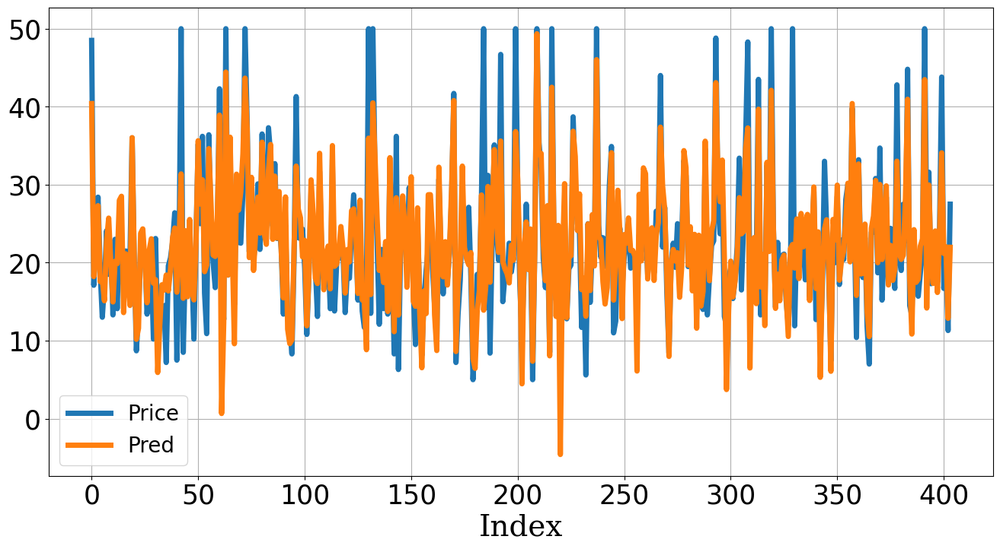

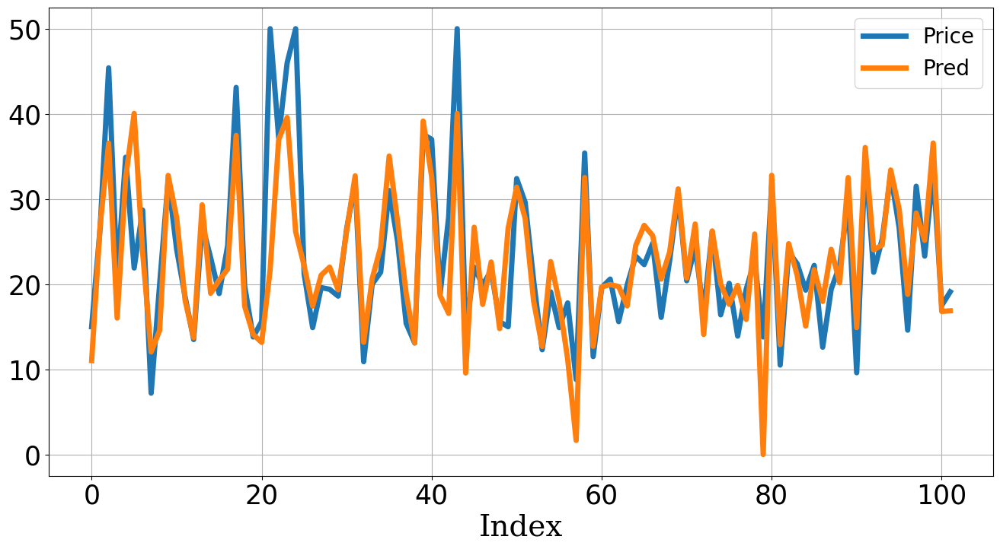

,MAE,MSE,MAPE
Train,3.07,21.05,0.16
Test,3.51,31.34,0.17


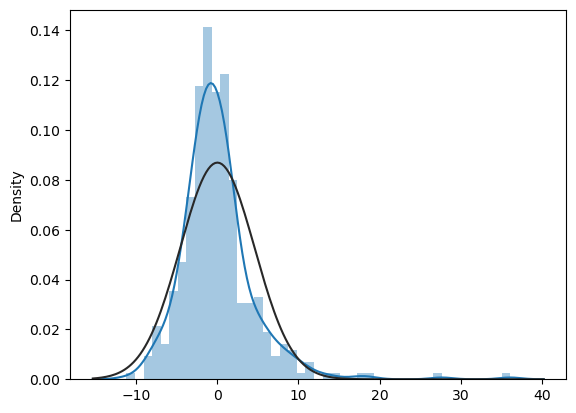

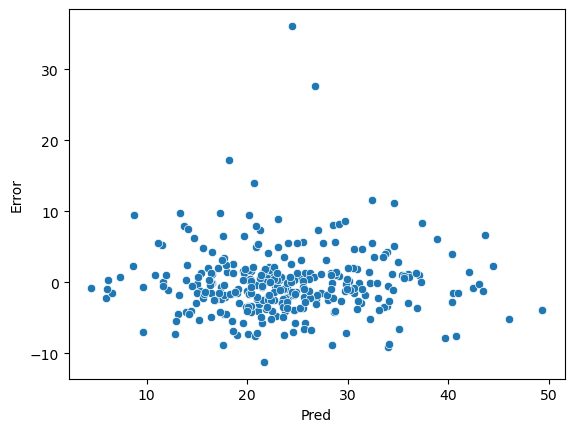

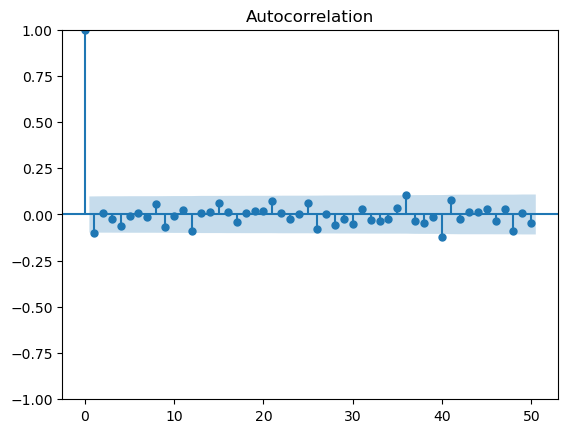

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.86,0.73,9.18,50.77
p-value,0.00,0.03,0.51,0.44
Alternative,NaN,two-sided,NaN,NaN


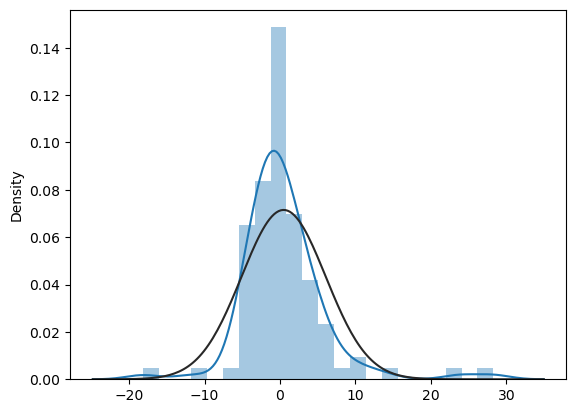

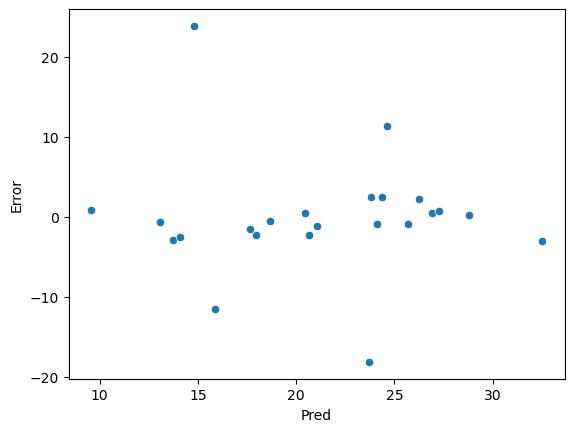

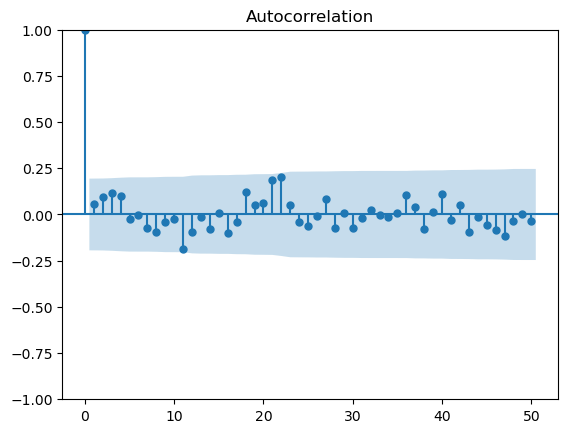

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.83,0.13,5.77,41.83
p-value,0.00,0.00,0.83,0.79
Alternative,NaN,two-sided,NaN,NaN


In [4]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Linear Regression
X_train_fes = sm.add_constant(X_train_fes)
X_test_fes = sm.add_constant(X_test_fes)
model_lr = sm.OLS(Y_train, X_train_fes).fit()
display(model_lr.summary())

Y_trpred = pd.DataFrame(model_lr.predict(X_train_fes), columns=['Pred'])
Y_tepred = pd.DataFrame(model_lr.predict(X_test_fes), columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_lr = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_lr)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

# **Advanced Algorithm:** Regularization

## Ridge

(404, 13) (404, 1)
(102, 13) (102, 1)


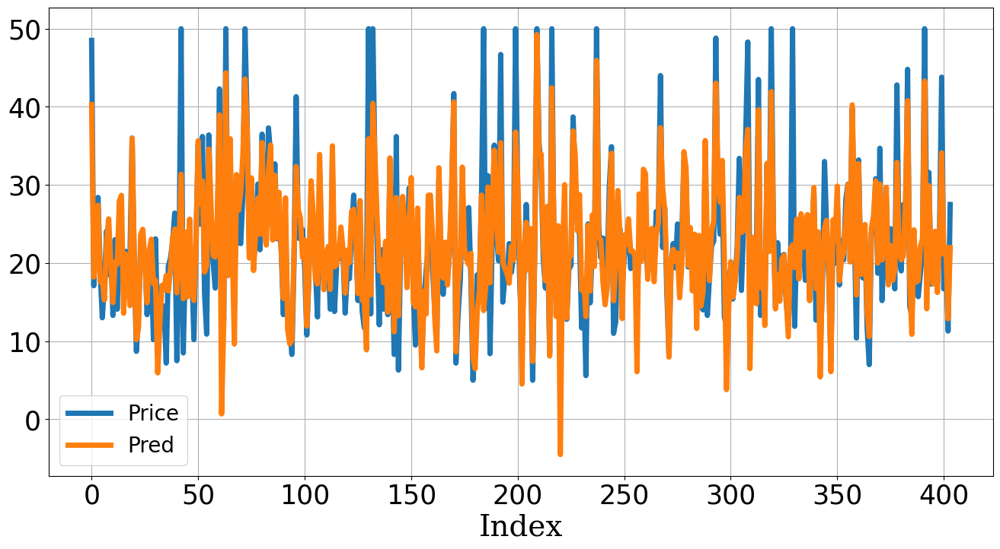

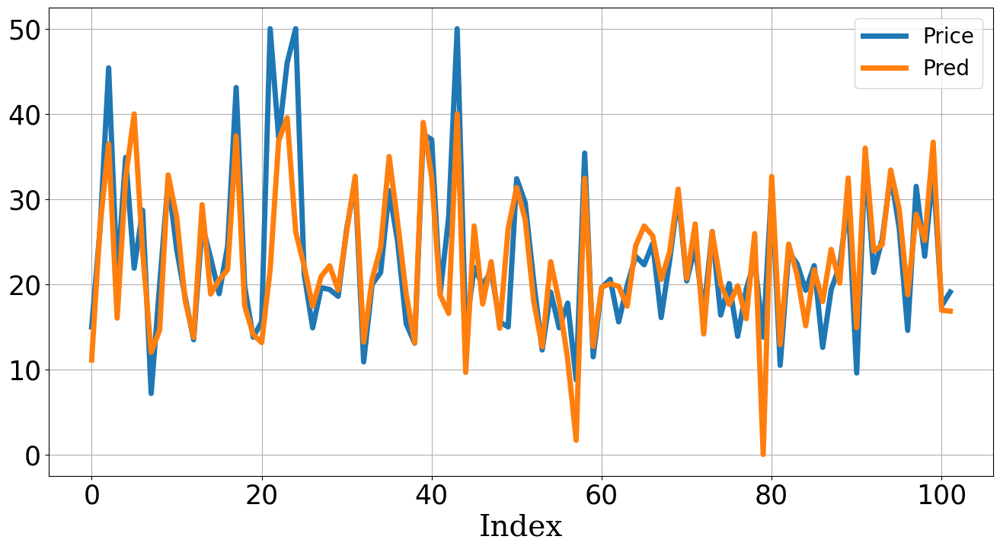

,MAE,MSE,MAPE
Train,3.06,21.06,0.16
Test,3.51,31.30,0.17


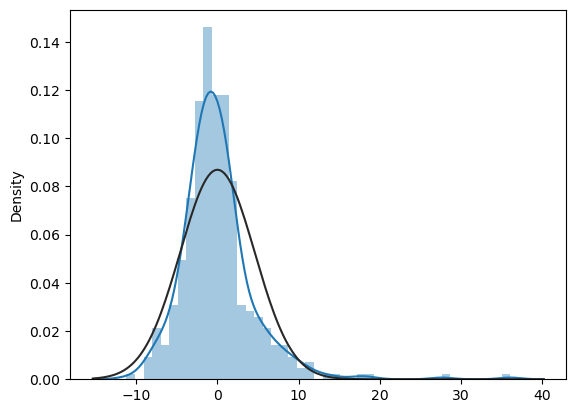

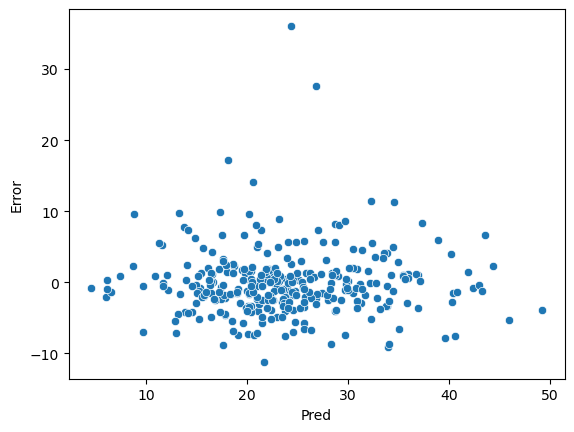

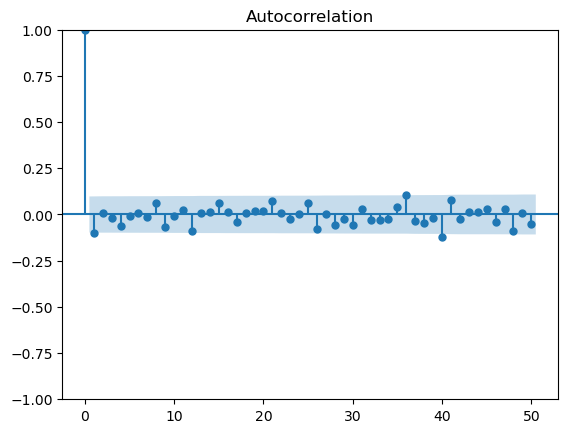

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.85,0.73,9.35,50.79
p-value,0.00,0.03,0.50,0.44
Alternative,NaN,two-sided,NaN,NaN


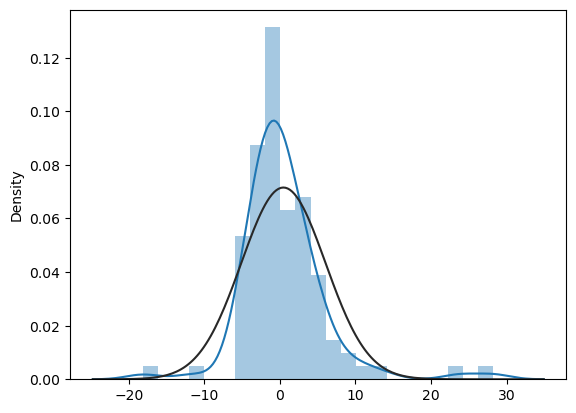

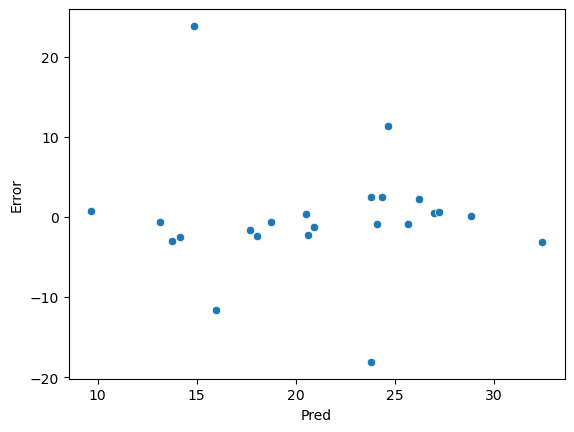

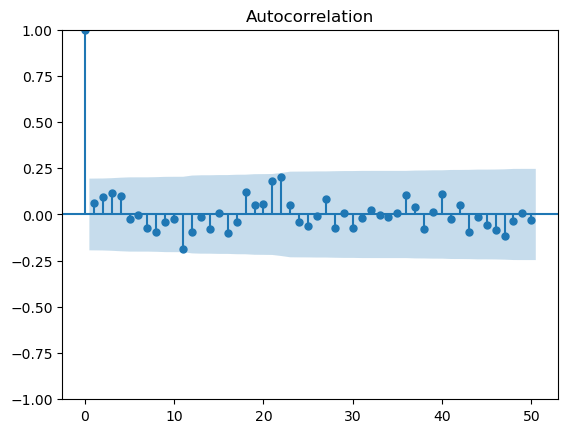

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.83,0.13,5.74,42.12
p-value,0.00,0.00,0.84,0.78
Alternative,NaN,two-sided,NaN,NaN


In [5]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Ridge
alpha_weight = 0.05
model_ridge = Ridge(alpha=alpha_weight, fit_intercept=True, random_state=123)
model_ridge.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_ridge.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_ridge.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_ridge = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_ridge)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## Lasso

(404, 13) (404, 1)
(102, 13) (102, 1)


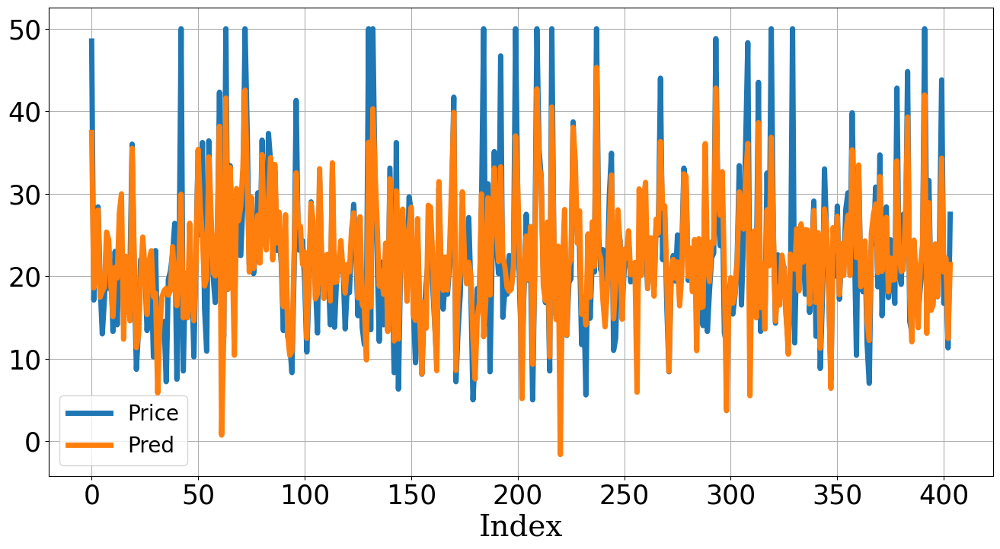

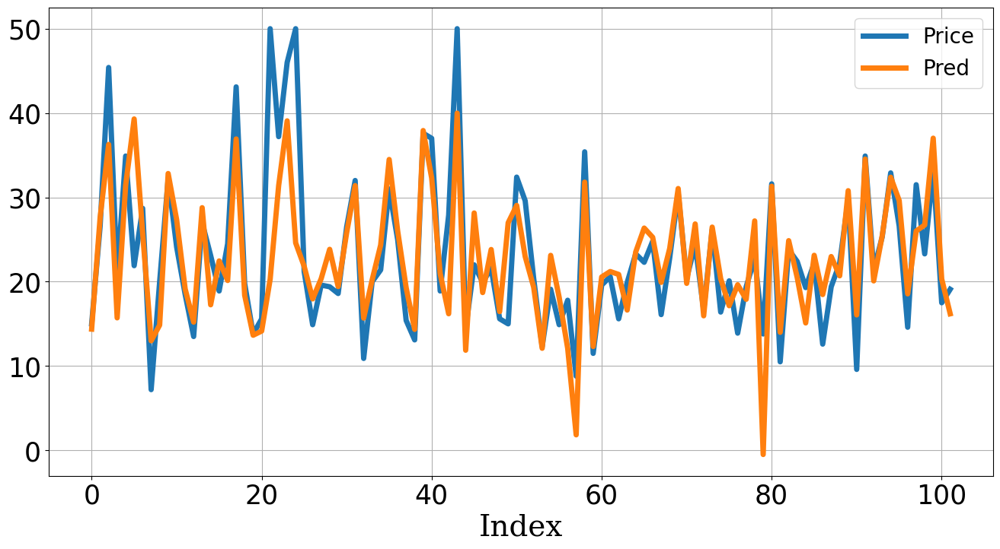

,MAE,MSE,MAPE
Train,3.20,23.34,0.17
Test,3.75,34.78,0.18


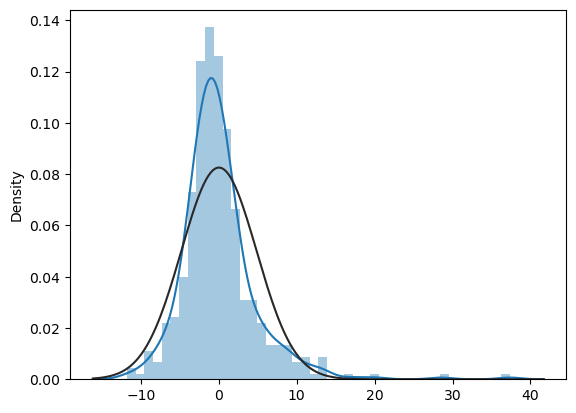

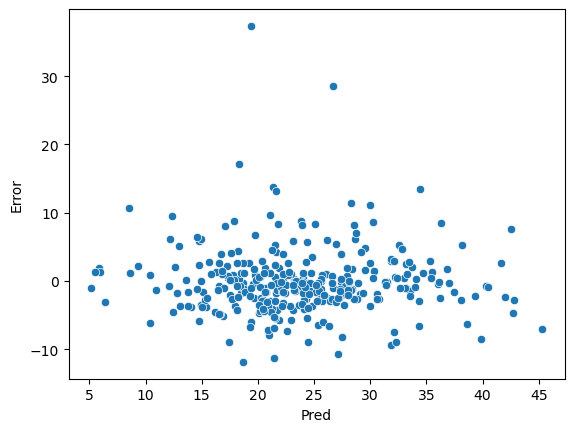

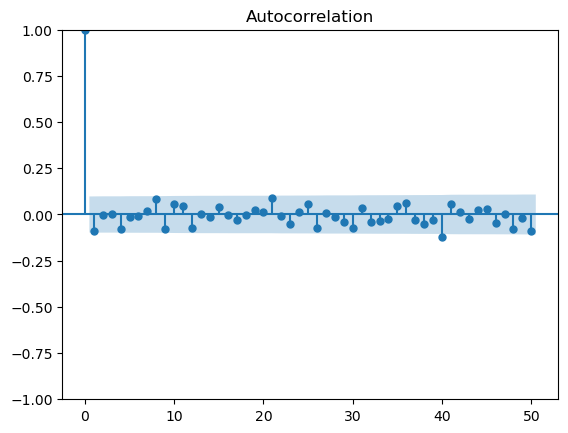

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.85,0.73,12.97,52.84
p-value,0.00,0.03,0.23,0.36
Alternative,NaN,two-sided,NaN,NaN


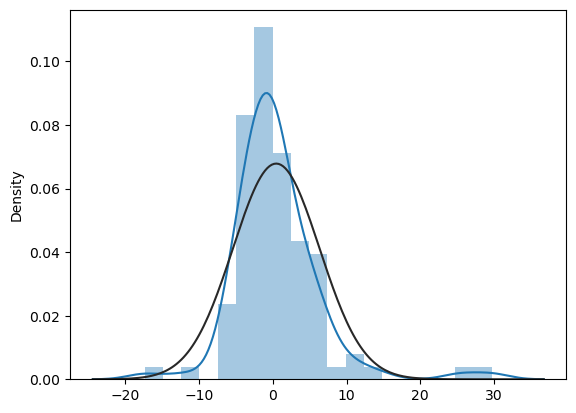

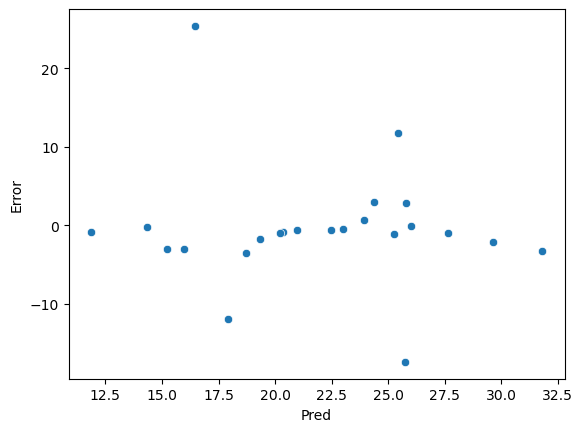

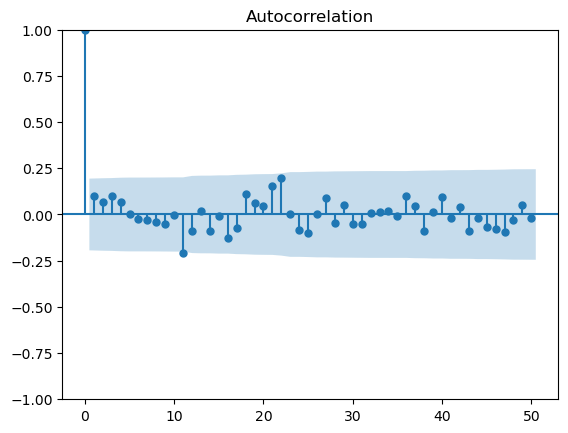

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.84,0.13,3.85,40.54
p-value,0.00,0.00,0.95,0.83
Alternative,NaN,two-sided,NaN,NaN


In [6]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Lasso
alpha_weight = 0.05
model_lasso = Lasso(alpha=alpha_weight, fit_intercept=True, random_state=123)
model_lasso.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_lasso.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_lasso.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_lasso = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_lasso)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## Elastic Net

(404, 13) (404, 1)
(102, 13) (102, 1)


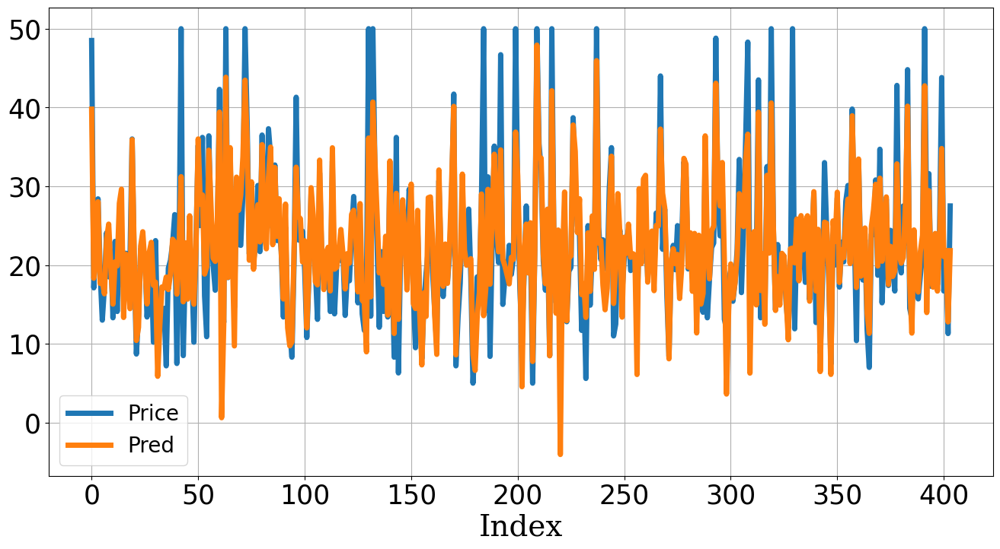

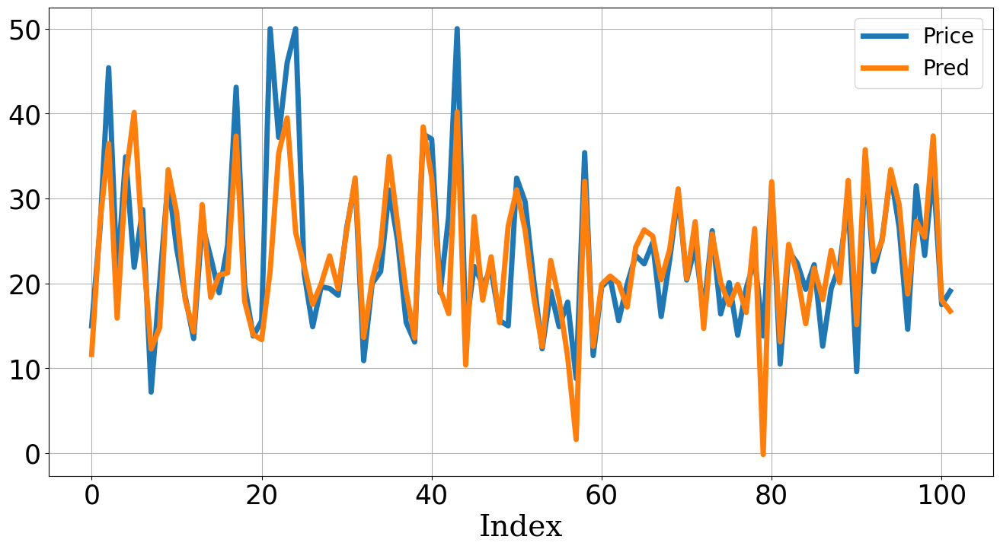

,MAE,MSE,MAPE
Train,3.06,21.35,0.16
Test,3.56,32.00,0.17


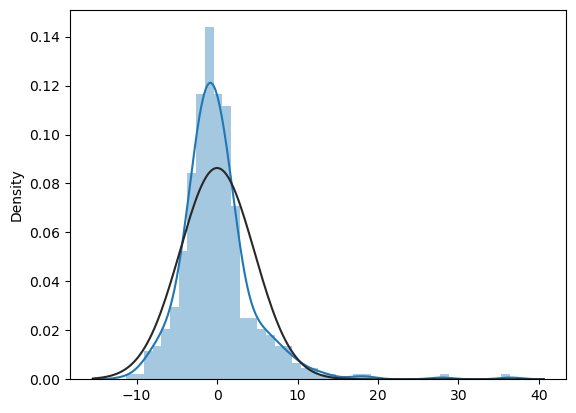

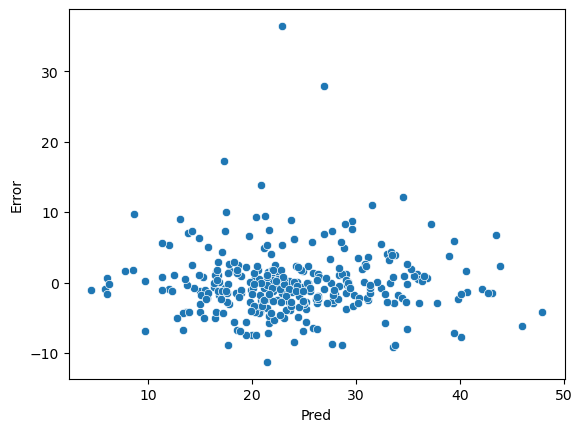

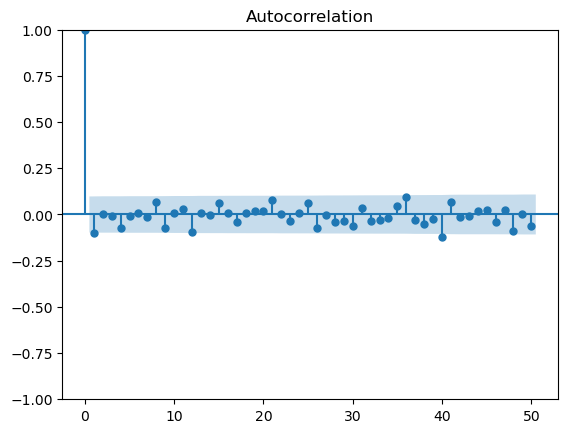

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.85,0.73,10.41,51.37
p-value,0.00,0.03,0.40,0.42
Alternative,NaN,two-sided,NaN,NaN


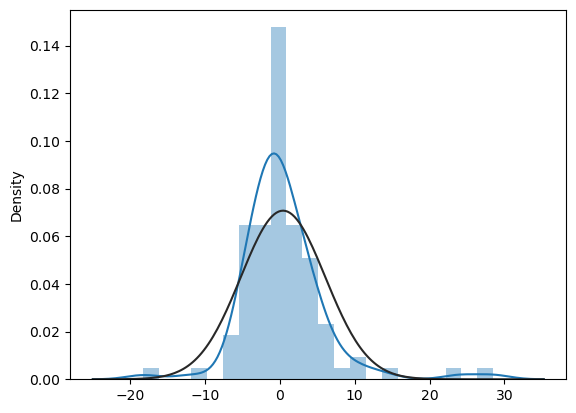

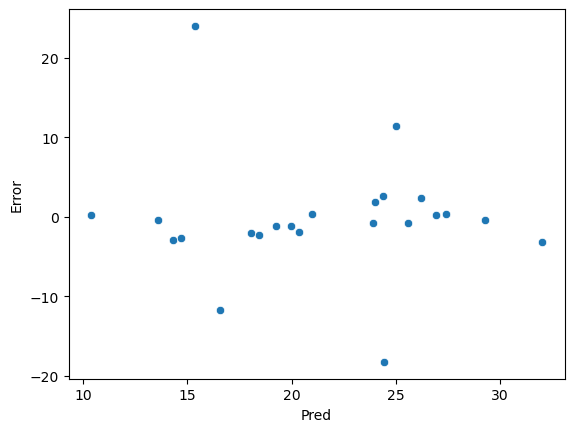

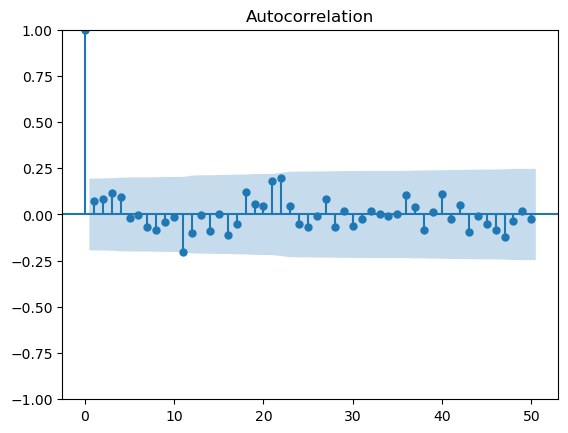

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.83,0.13,5.21,42.16
p-value,0.00,0.00,0.88,0.78
Alternative,NaN,two-sided,NaN,NaN


In [7]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Elastic Net
model_en = ElasticNet(alpha=0.01, l1_ratio=1, fit_intercept=True, random_state=123)
model_en.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_en.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_en.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_en = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_en)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

# **Advanced Algorithm:** Voting

(404, 13) (404, 1)
(102, 13) (102, 1)


  File "C:\Users\KK\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\KK\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\KK\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\KK\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


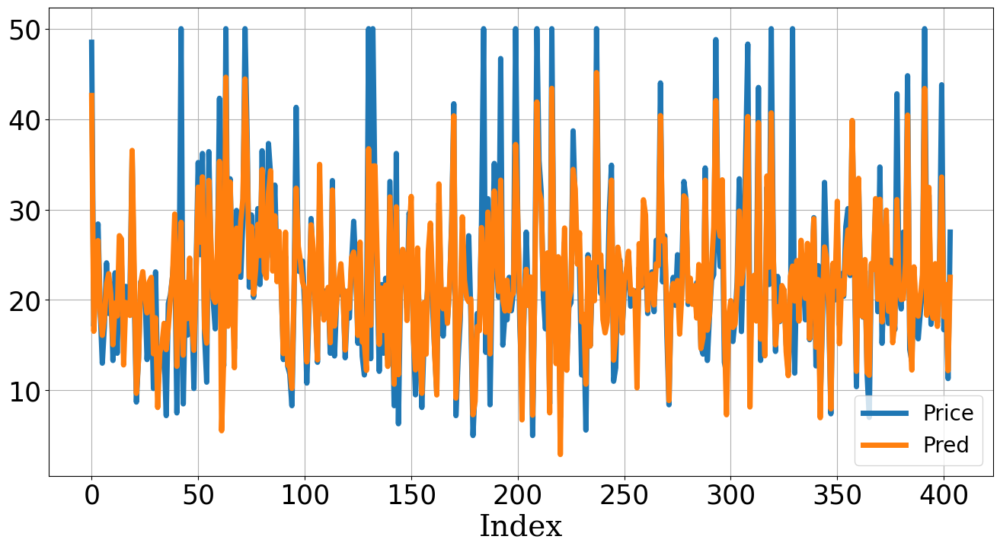

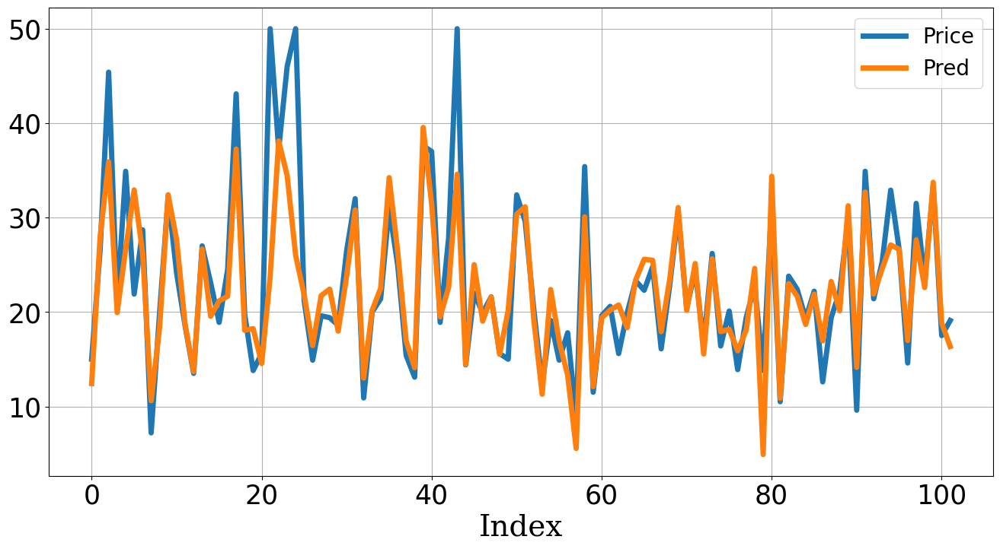

,MAE,MSE,MAPE
Train,2.43,14.97,0.12
Test,2.86,25.04,0.12


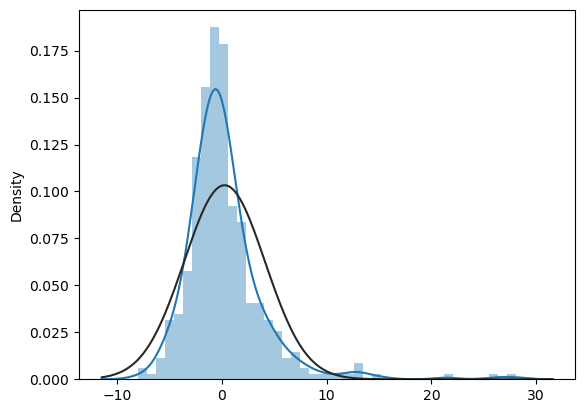

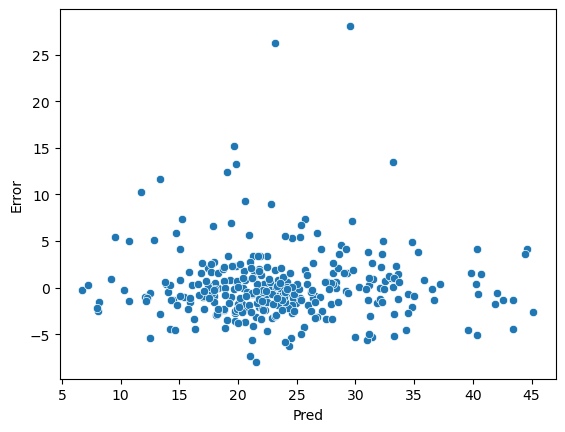

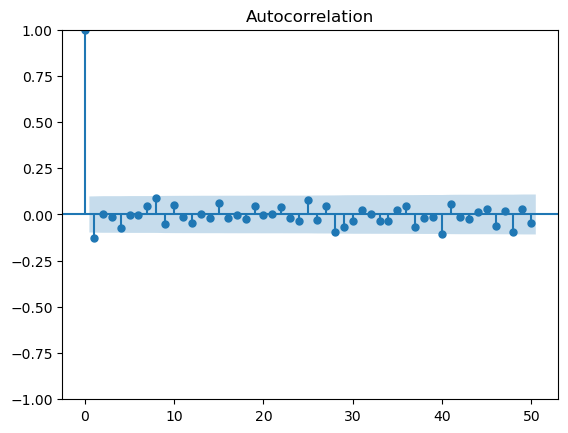

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.80,0.66,15.28,50.55
p-value,0.00,0.01,0.12,0.45
Alternative,NaN,two-sided,NaN,NaN


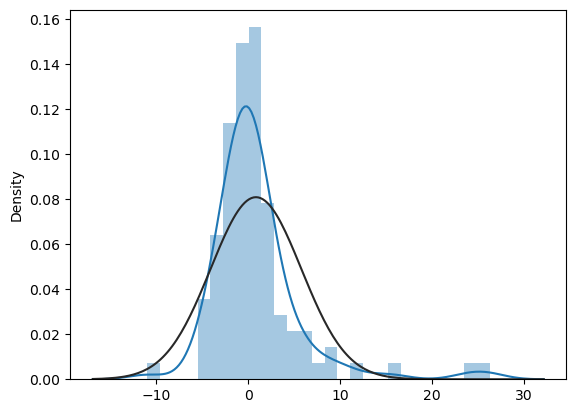

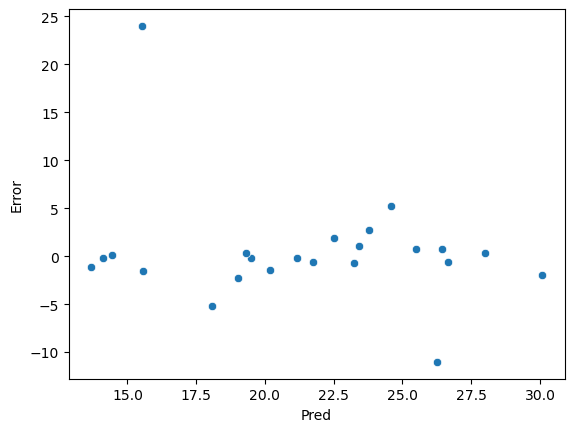

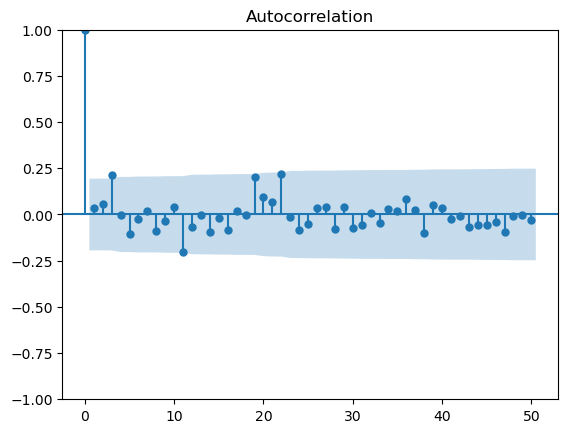

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.76,0.11,7.81,41.40
p-value,0.00,0.00,0.65,0.80
Alternative,NaN,two-sided,NaN,NaN


In [8]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Voting
## Weak Learners
model_reg = LinearRegression()
model_knn = KNeighborsRegressor()
res = [('LR', model_reg), ('KNN', model_knn)]
model_voting = VotingRegressor(estimators=res)
model_voting.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_voting.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_voting.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_voting = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_voting)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

# **Advanced Algorithm:** Bagging

##  Decision Tree

(404, 13) (404, 1)
(102, 13) (102, 1)


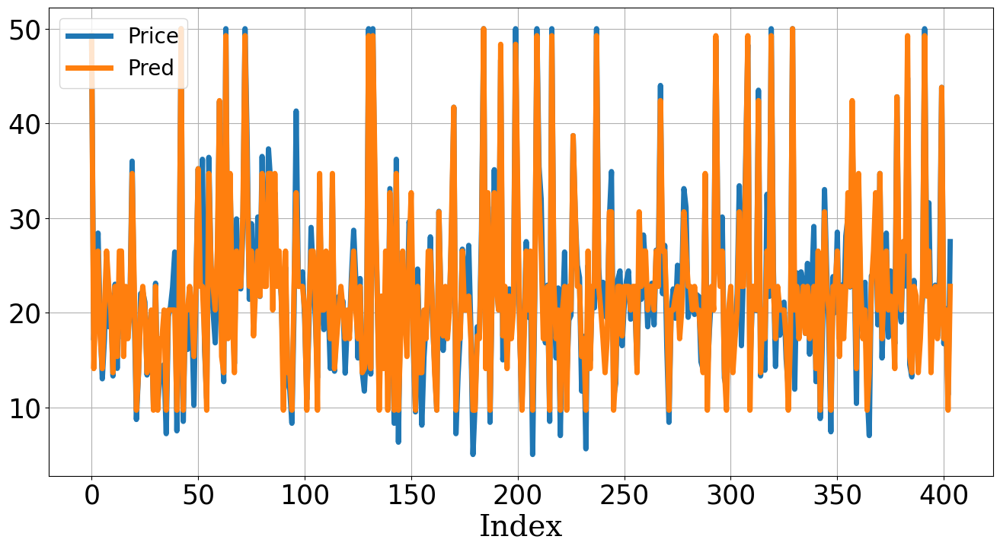

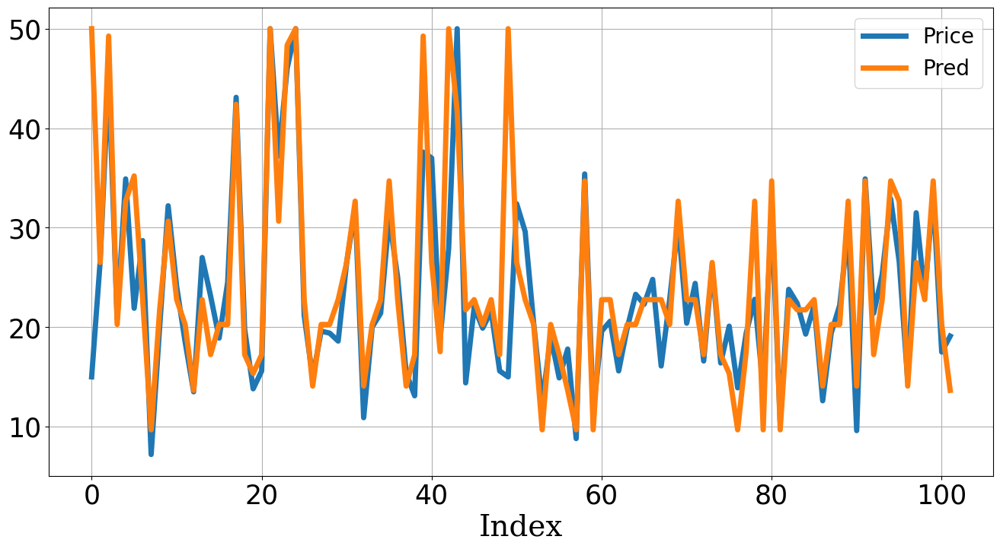

,MAE,MSE,MAPE
Train,1.92,6.37,0.11
Test,3.51,42.36,0.18


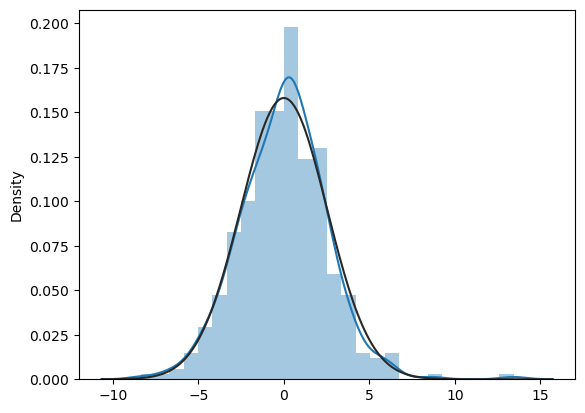

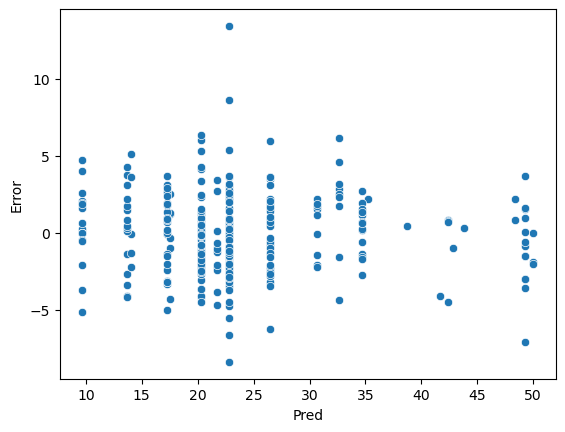

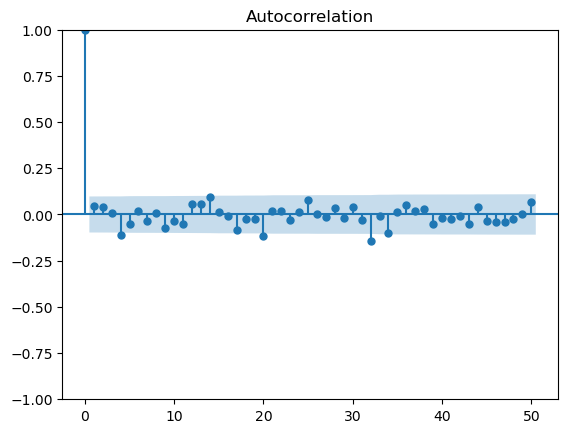

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.98,1.06,11.05,57.18
p-value,0.00,0.70,0.35,0.23
Alternative,NaN,two-sided,NaN,NaN


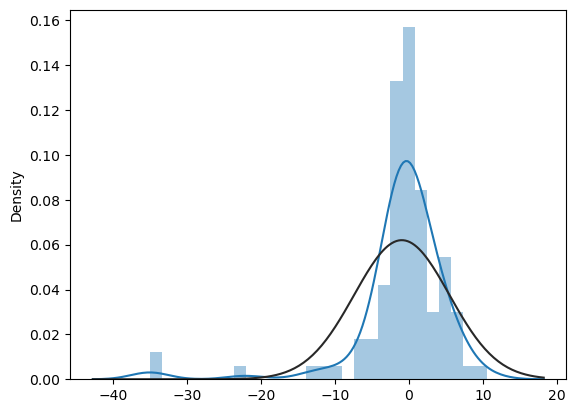

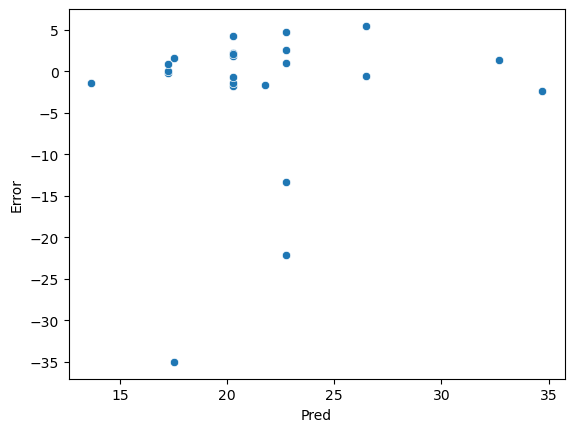

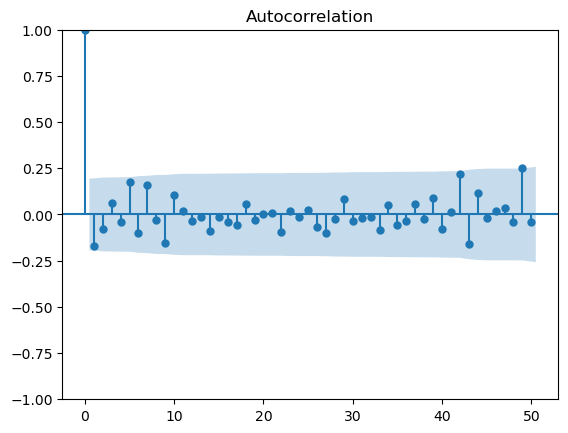

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.69,0.18,15.79,57.74
p-value,0.00,0.00,0.11,0.21
Alternative,NaN,two-sided,NaN,NaN


In [9]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Decision Tree
model_dt = DecisionTreeRegressor(criterion='squared_error', max_depth=5,
                                 random_state=123)
model_dt.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_dt.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_dt.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_dt = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_dt)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## Random Forest

(404, 13) (404, 1)
(102, 13) (102, 1)


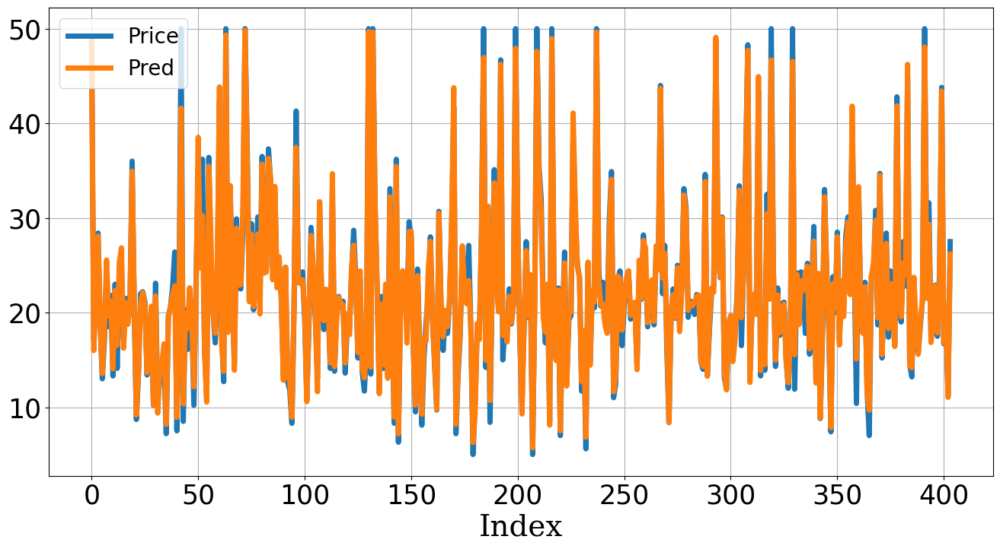

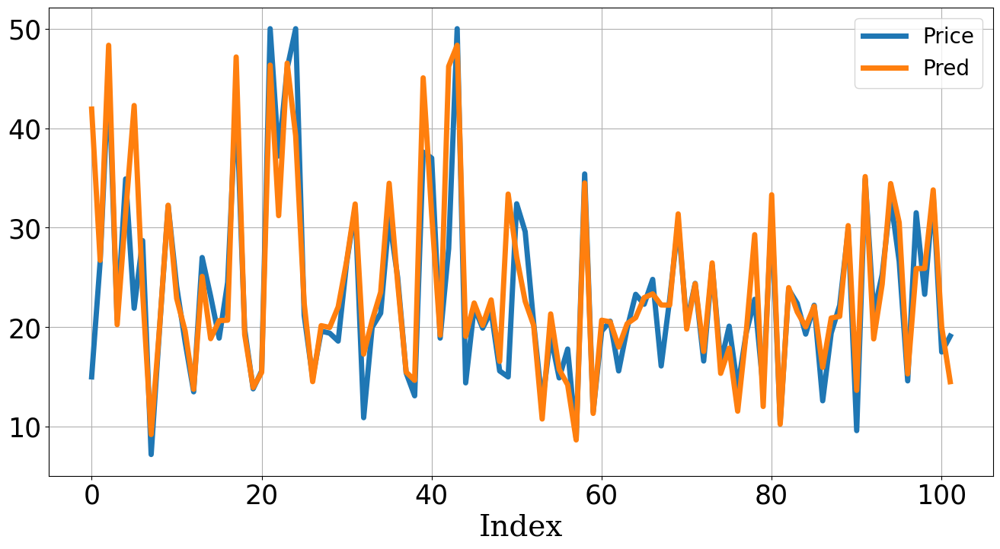

,MAE,MSE,MAPE
Train,0.86,1.55,0.04
Test,2.71,25.67,0.13


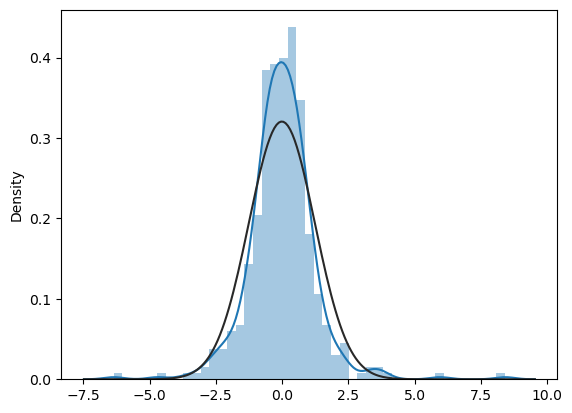

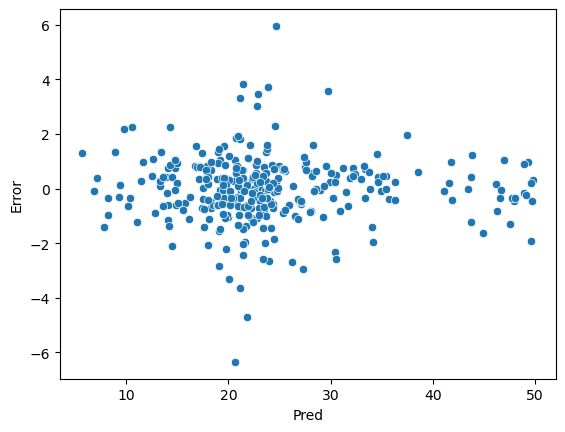

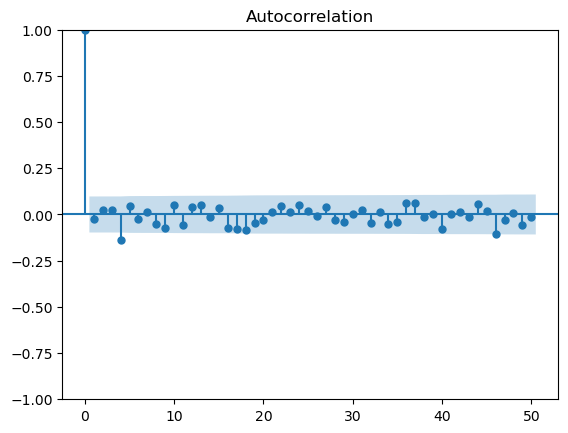

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.91,0.70,14.52,49.71
p-value,0.00,0.02,0.15,0.49
Alternative,NaN,two-sided,NaN,NaN


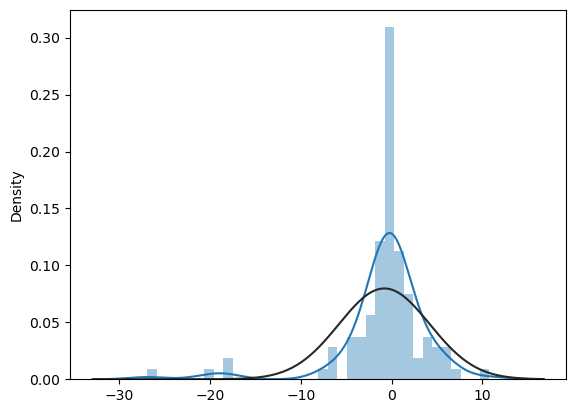

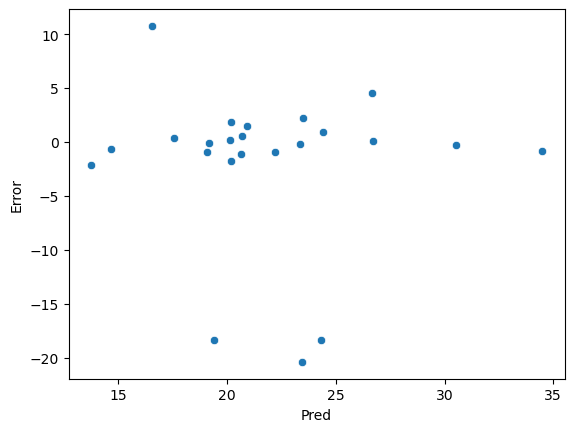

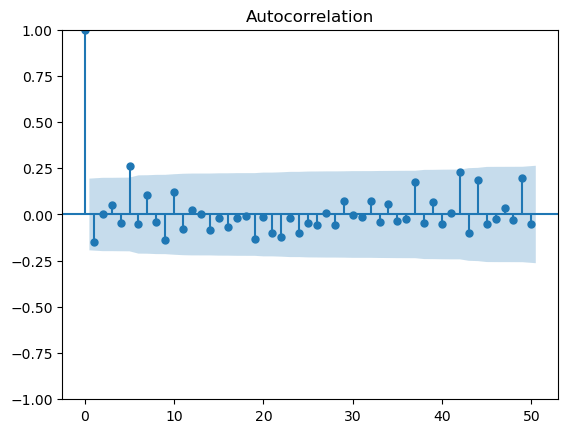

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.73,0.12,15.91,62.15
p-value,0.00,0.00,0.10,0.12
Alternative,NaN,two-sided,NaN,NaN


In [10]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Random Forest
model_rf = RandomForestRegressor(n_estimators=100, random_state=123)
model_rf.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_rf.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_rf.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_rf = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_rf)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## Random Forest with Hyperparameter Tuning

(404, 13) (404, 1)
(102, 13) (102, 1)
최적 하이퍼 파라미터:  {'max_depth': 11, 'min_samples_leaf': 5, 'min_samples_split': 5, 'n_estimators': 100}


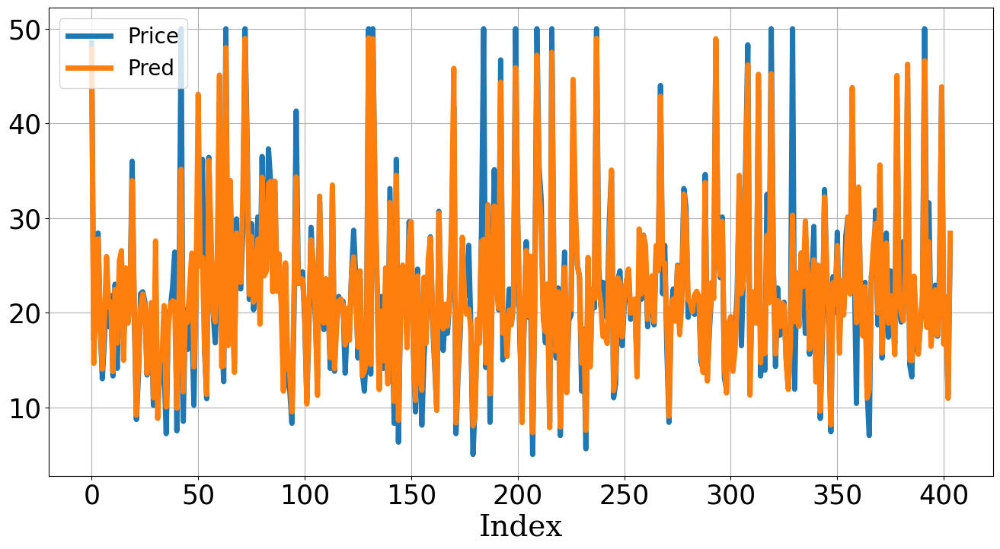

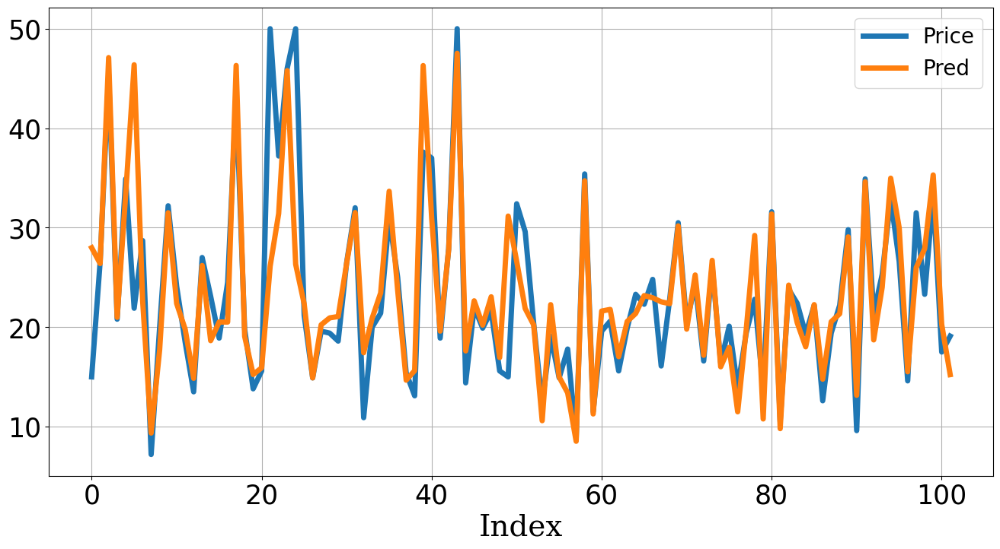

,MAE,MSE,MAPE
Train,1.64,7.52,0.08
Test,2.86,28.31,0.13


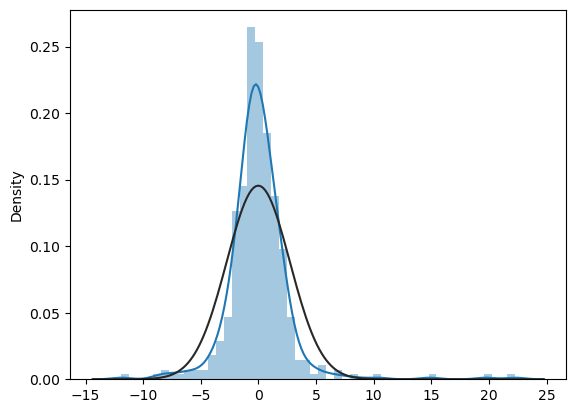

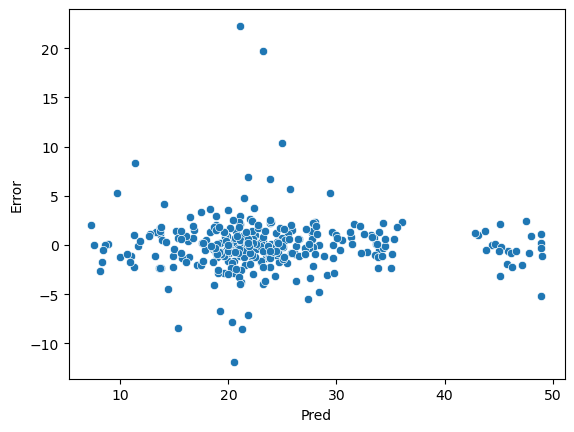

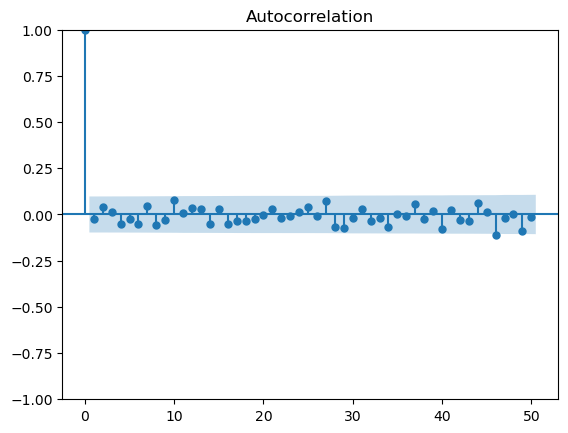

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.78,0.76,8.61,42.25
p-value,0.00,0.07,0.57,0.77
Alternative,NaN,two-sided,NaN,NaN


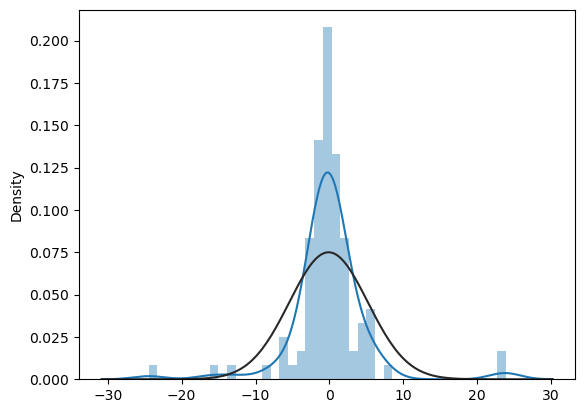

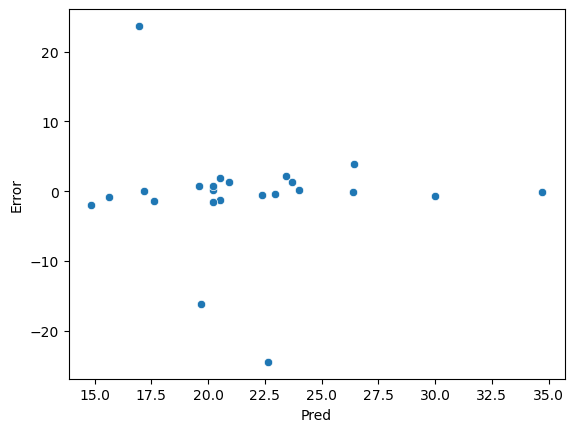

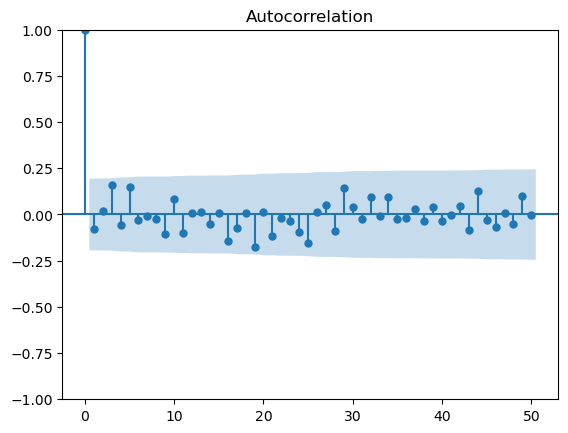

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.75,0.06,8.56,40.65
p-value,0.00,0.00,0.57,0.82
Alternative,NaN,two-sided,NaN,NaN


In [11]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Random Forest
model_rf = RandomForestRegressor(random_state=123)
params = {'n_estimators': [100],  
          'max_depth': [5, 7, 9, 11],   
          'min_samples_leaf': [5, 7, 9, 11],   
          'min_samples_split': [5, 7, 9, 11]}  
model_rf_cv = GridSearchCV(estimator=model_rf, param_grid=params, 
                           cv=5,   
                           n_jobs=-1)   
model_rf_cv.fit(X_train_fes, Y_train)
print("최적 하이퍼 파라미터: ", model_rf_cv.best_params_)

model_rf_cv_final = RandomForestRegressor(**model_rf_cv.best_params_)
model_rf_cv_final.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_rf_cv_final.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_rf_cv_final.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_rf_cv_final = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_rf_cv_final)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

# **Advanced Algorithm:** Boosting

## Gradient Boosting

(404, 13) (404, 1)
(102, 13) (102, 1)


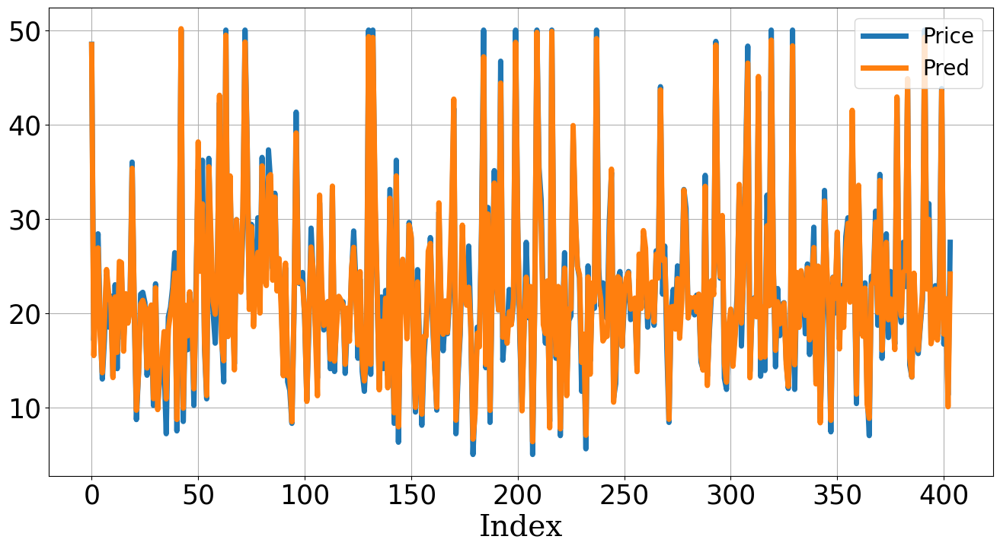

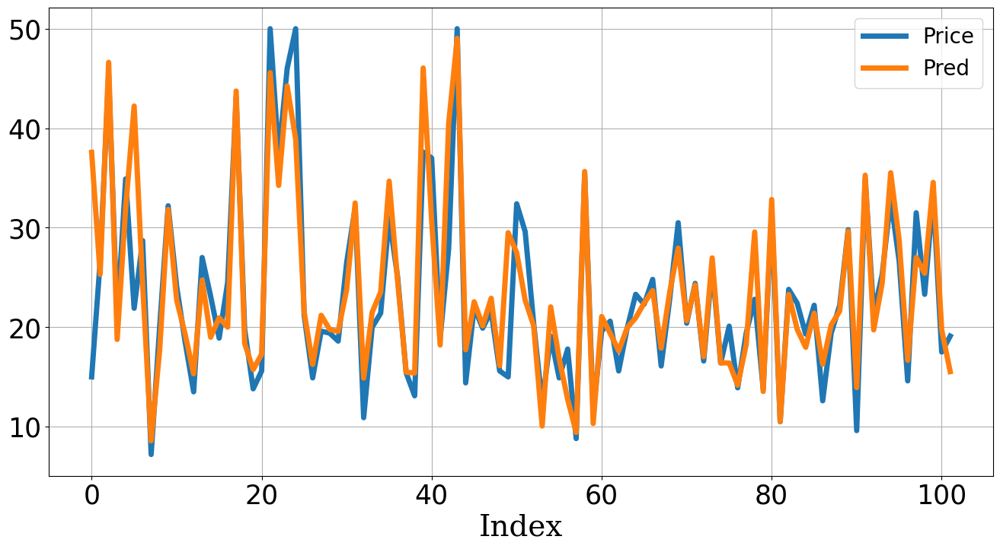

,MAE,MSE,MAPE
Train,1.10,1.95,0.06
Test,2.61,20.01,0.13


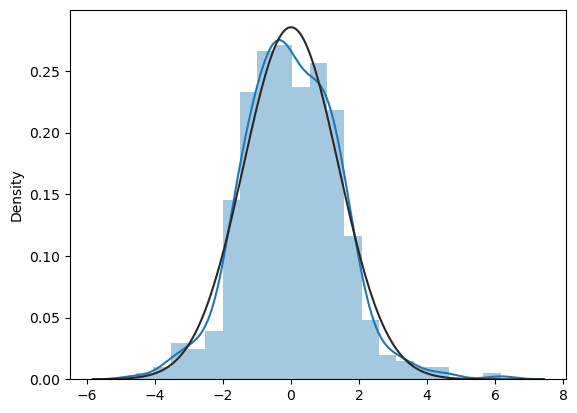

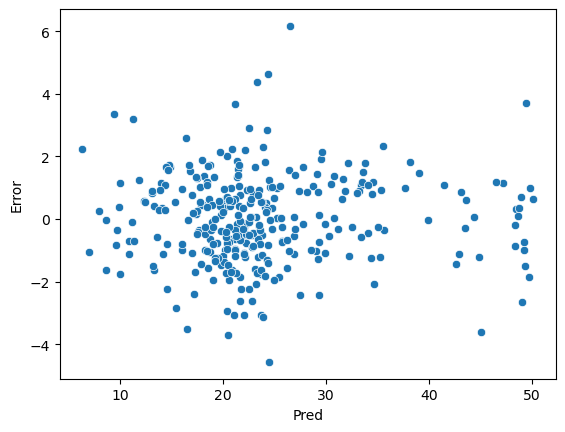

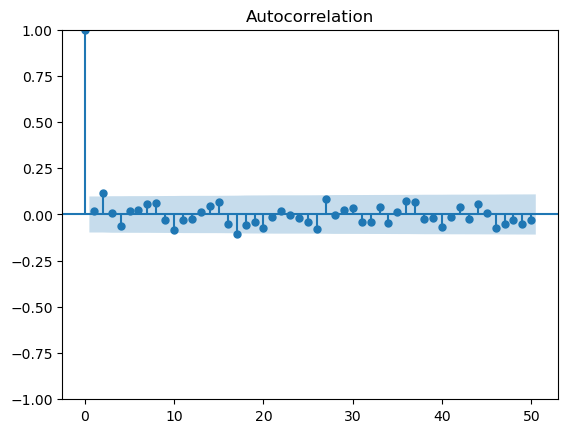

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.99,0.87,13.77,53.05
p-value,0.00,0.34,0.18,0.36
Alternative,NaN,two-sided,NaN,NaN


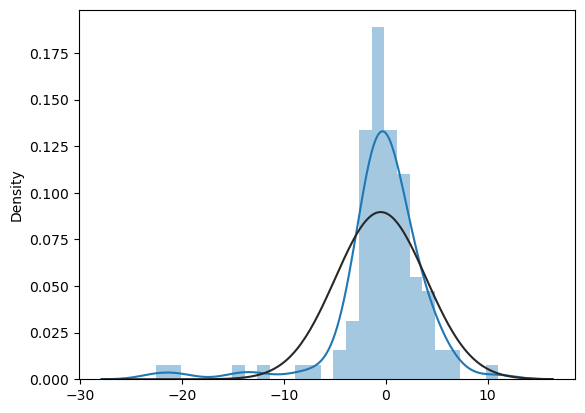

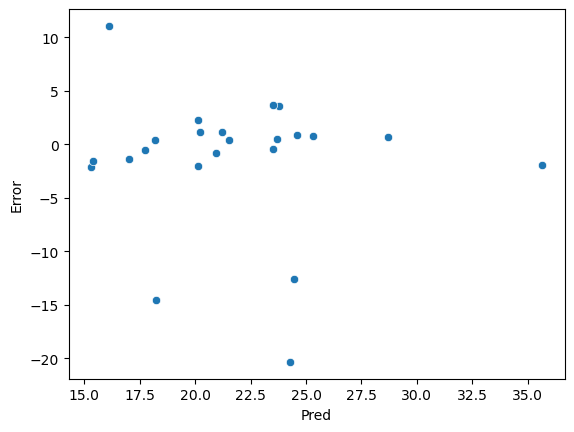

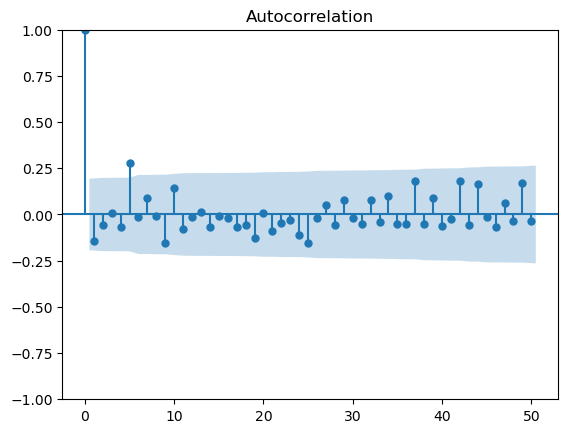

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.78,0.15,17.66,61.31
p-value,0.00,0.00,0.06,0.13
Alternative,NaN,two-sided,NaN,NaN


In [12]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Gradient Boosting
model_gb = GradientBoostingRegressor(n_estimators=100,
                                     learning_rate=0.1,
                                     max_depth=3, random_state=123)
model_gb.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_gb.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_gb.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_gb = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_gb)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## GBM with Hyperparameter Tuning

(404, 13) (404, 1)
(102, 13) (102, 1)
최적 하이퍼 파라미터:  {'learning_rate': 0.2, 'max_depth': 7, 'min_samples_leaf': 9, 'min_samples_split': 9, 'n_estimators': 100}


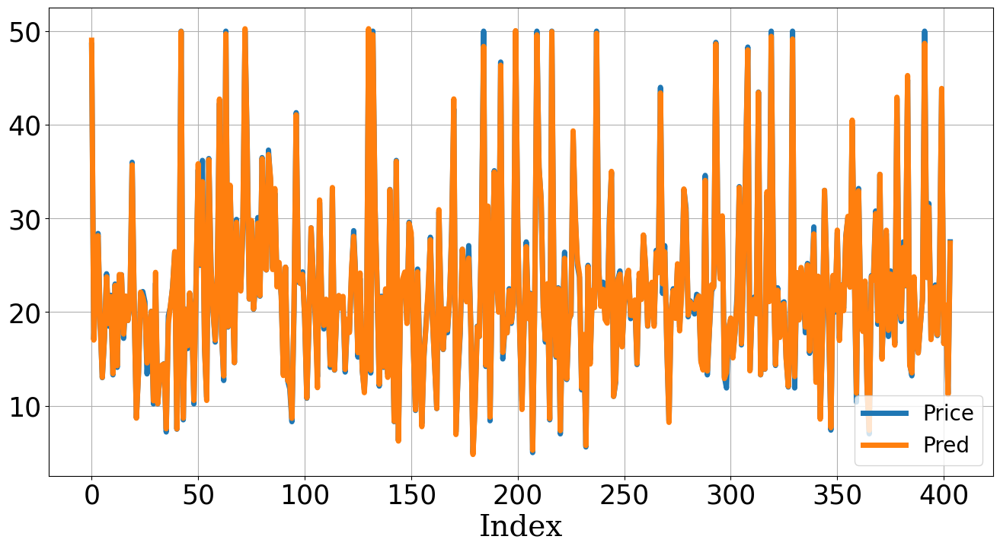

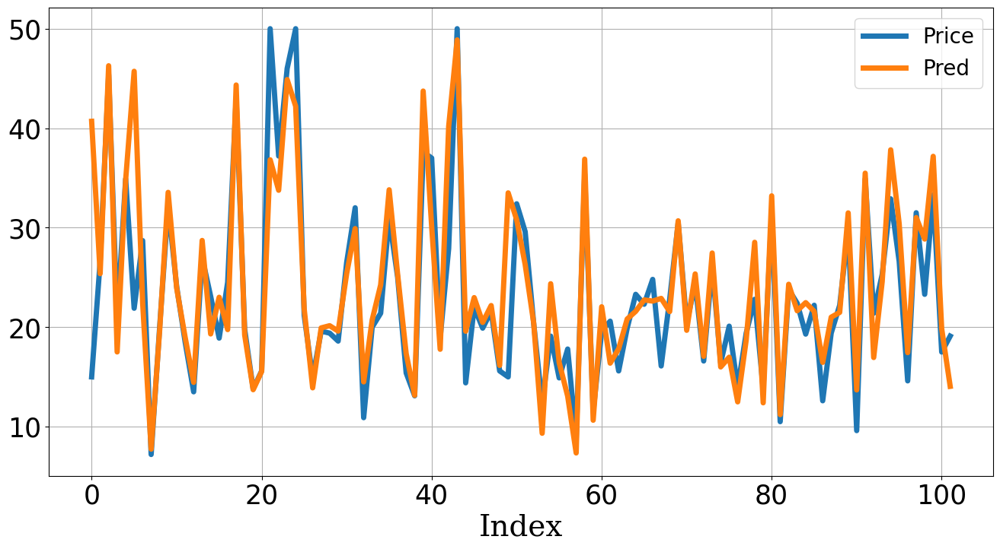

,MAE,MSE,MAPE
Train,0.27,0.15,0.01
Test,2.90,26.00,0.14


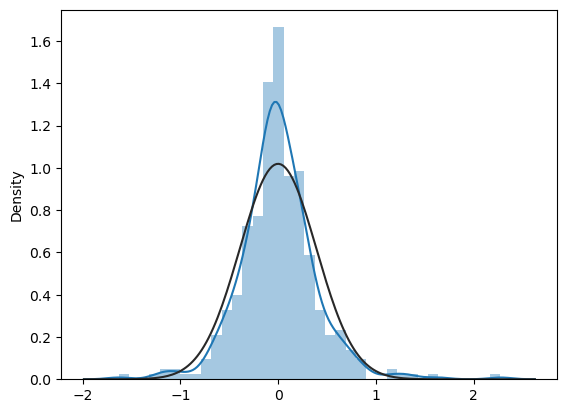

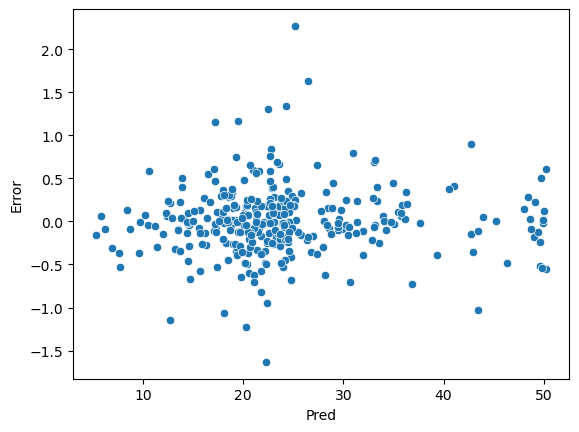

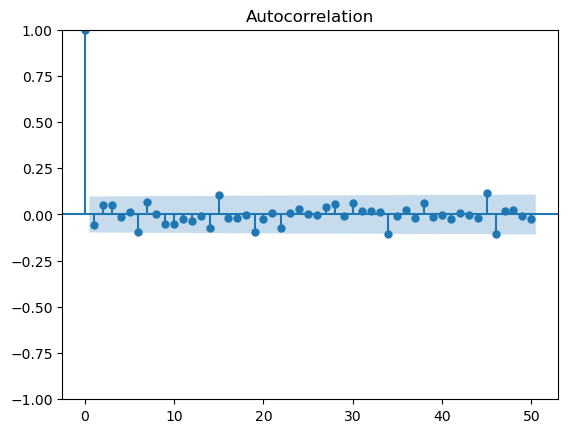

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.94,0.83,11.52,49.84
p-value,0.00,0.22,0.32,0.48
Alternative,NaN,two-sided,NaN,NaN


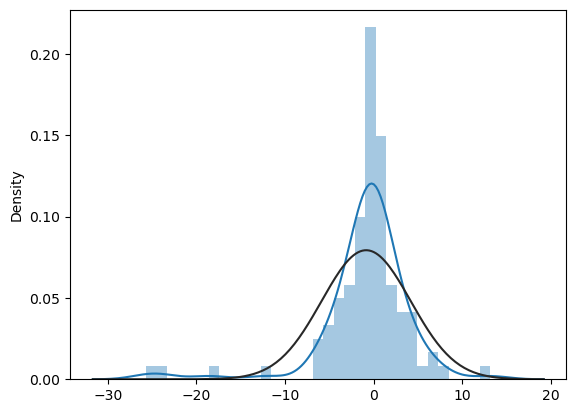

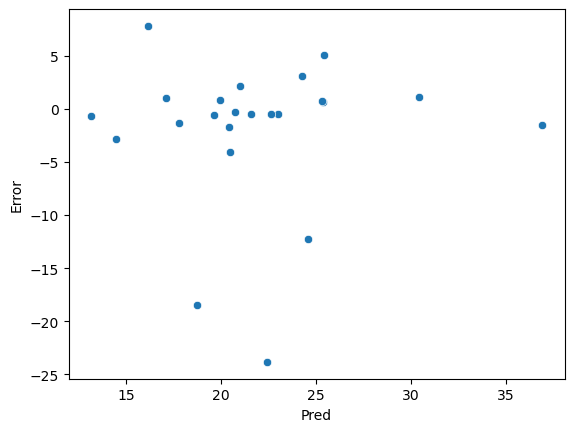

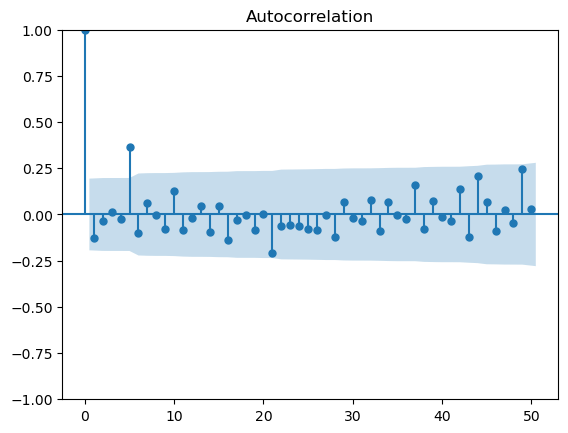

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.77,0.16,20.82,77.18
p-value,0.00,0.00,0.02,0.01
Alternative,NaN,two-sided,NaN,NaN


In [13]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Gradient Boosting
model_gb = GradientBoostingRegressor()
params = {'n_estimators': [100],   
          'max_depth': [5, 7, 9, 11],    
          'min_samples_leaf': [5, 7, 9, 115],   
          'min_samples_split': [5, 7, 9, 11],  
          'learning_rate': [0.05, 0.1, 0.2]}   
model_gb_cv = GridSearchCV(estimator=model_gb, param_grid=params, 
                           cv=5,   
                           n_jobs=-1)   
model_gb_cv.fit(X_train_fes, Y_train)
print("최적 하이퍼 파라미터: ", model_gb_cv.best_params_)

model_gb_cv_final = GradientBoostingRegressor(**model_gb_cv.best_params_)
model_gb_cv_final.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_gb_cv_final.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_gb_cv_final.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_gb_cv_final = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_gb_cv_final)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## XGBoost

(404, 13) (404, 1)
(102, 13) (102, 1)


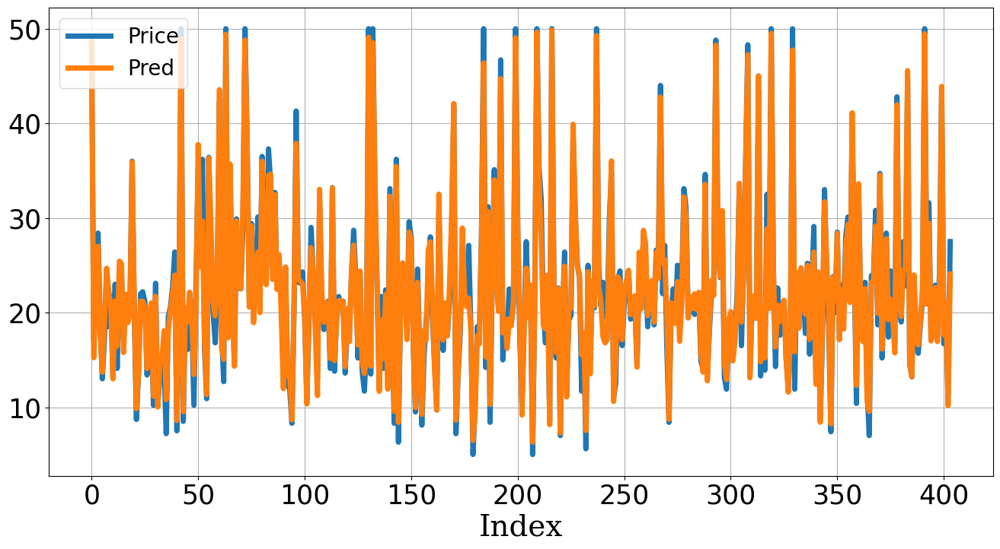

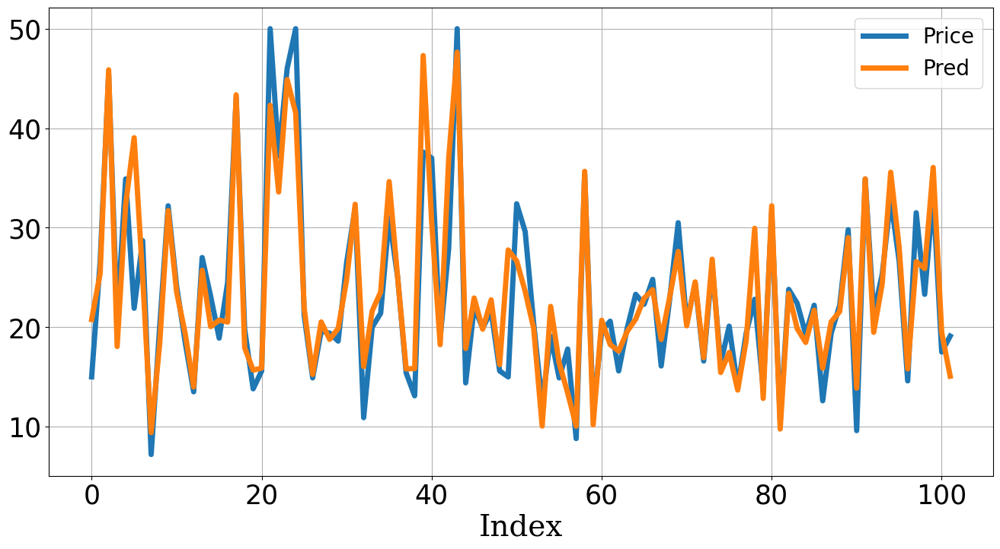

,MAE,MSE,MAPE
Train,1.17,2.33,0.06
Test,2.35,13.00,0.11


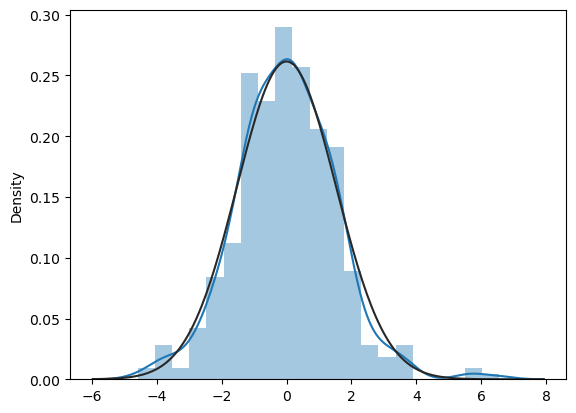

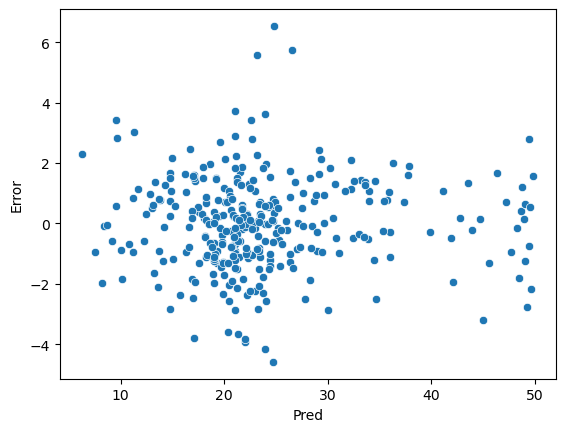

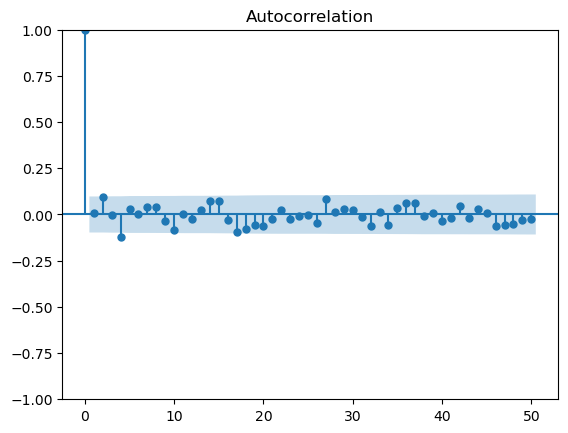

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.99,0.79,15.13,50.14
p-value,0.00,0.11,0.13,0.47
Alternative,NaN,two-sided,NaN,NaN


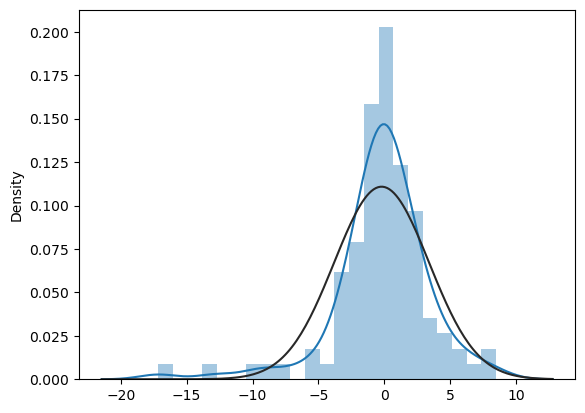

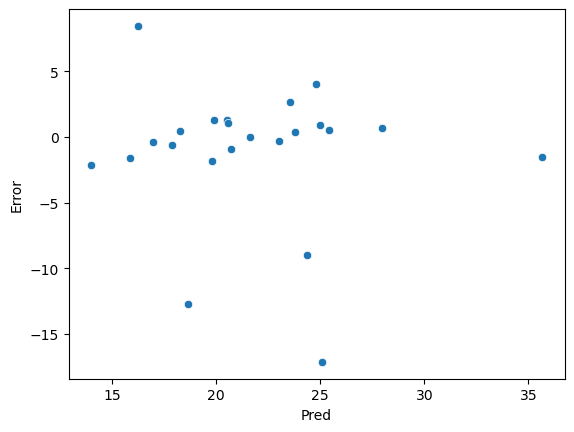

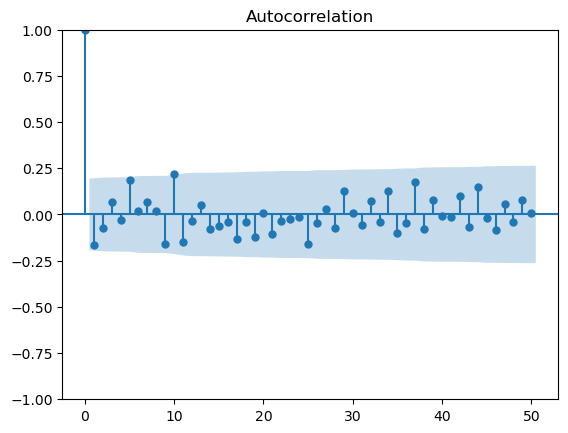

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.89,0.21,17.08,58.05
p-value,0.00,0.00,0.07,0.20
Alternative,NaN,two-sided,NaN,NaN


In [14]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# XGBoost
model_xgb = XGBRegressor(n_estimators=100,
                         learning_rate=0.1,
                         max_depth=3, random_state=123)
model_xgb.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_xgb.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_xgb.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_xgb = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_xgb)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## XGBoost with Hyperparameter Tuning

(404, 13) (404, 1)
(102, 13) (102, 1)
최적 하이퍼 파라미터:  {'gamma': 0.9, 'max_depth': 7, 'min_child_weight': 11, 'n_estimators': 100}


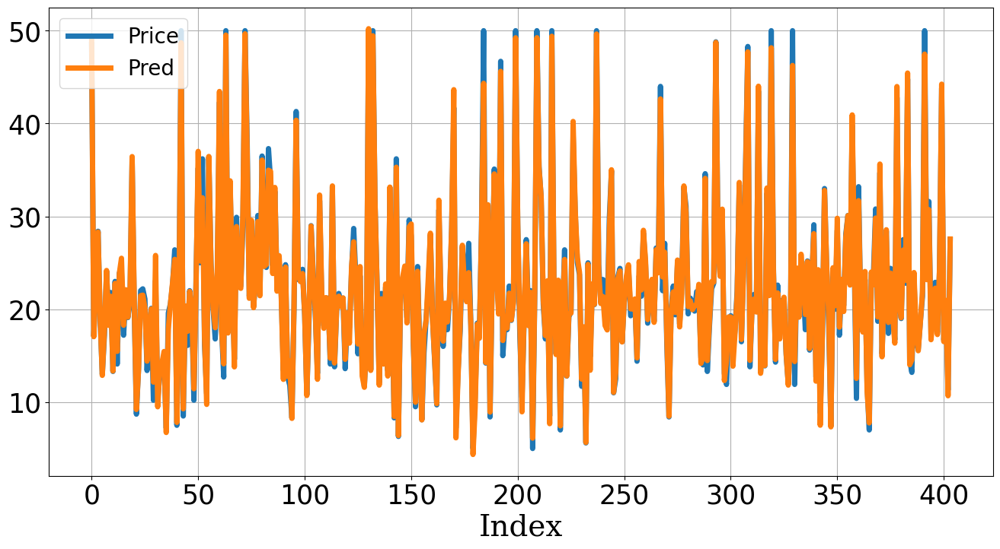

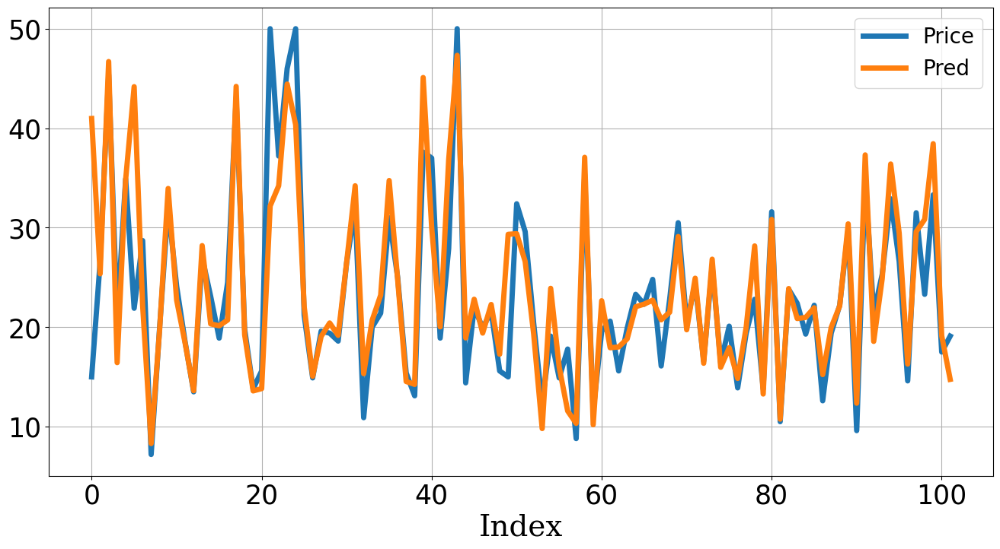

,MAE,MSE,MAPE
Train,0.64,0.80,0.03
Test,2.77,24.67,0.13


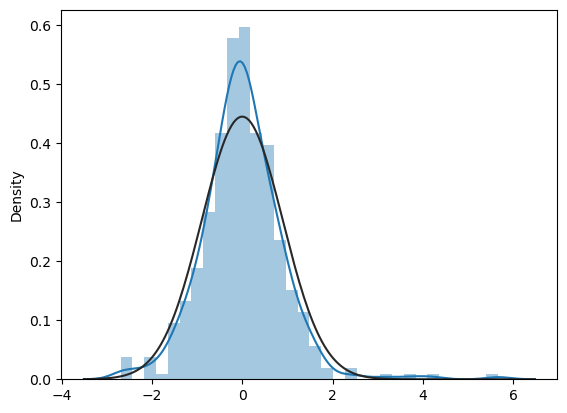

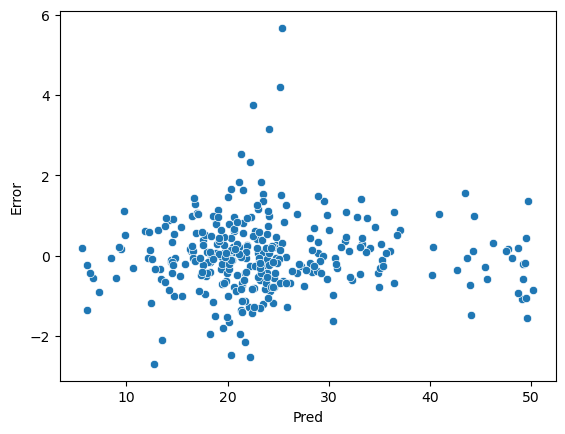

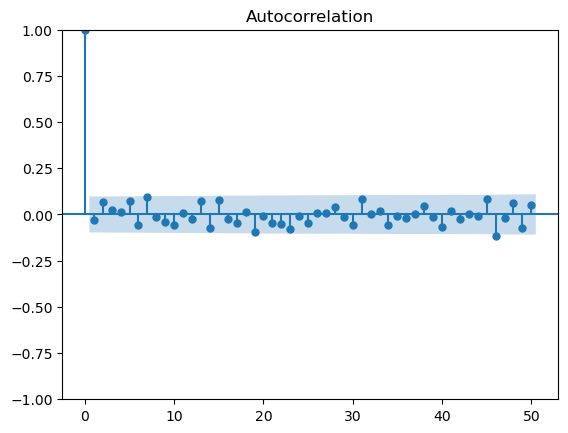

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.94,0.78,11.66,55.62
p-value,0.00,0.10,0.31,0.27
Alternative,NaN,two-sided,NaN,NaN


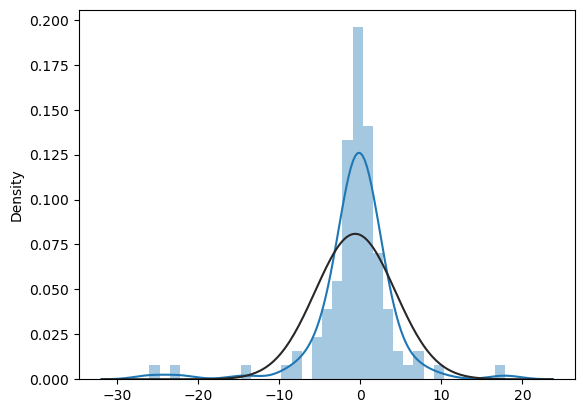

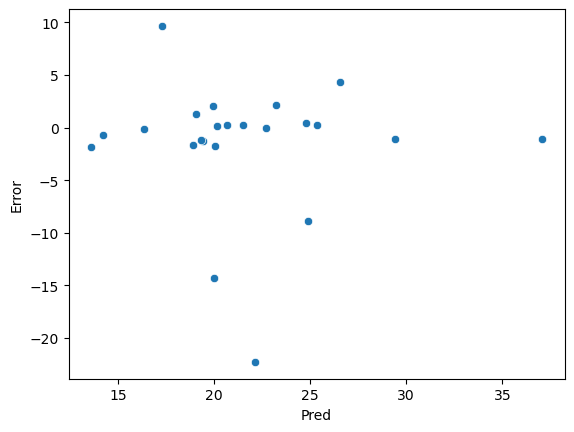

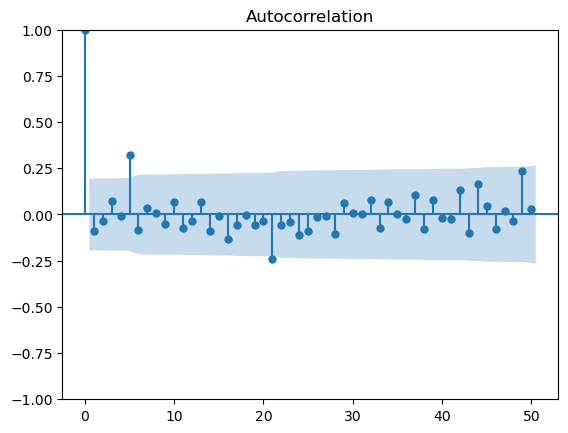

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.77,0.13,14.52,62.24
p-value,0.00,0.00,0.15,0.11
Alternative,NaN,two-sided,NaN,NaN


In [15]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# XGBoost
model_xgb = XGBRegressor()
params = {'n_estimators': [100],   
          'max_depth': [5, 7, 9, 11],    
          'gamma': [0.1, 0.3, 0.5, 0.7, 0.9],    
          'min_child_weight': [5, 7, 9, 11]}   
model_xgb_cv = GridSearchCV(estimator=model_xgb, param_grid=params, 
                            cv=5,    
                            n_jobs=-1)    
model_xgb_cv.fit(X_train_fes, Y_train)
print("최적 하이퍼 파라미터: ", model_xgb_cv.best_params_)

model_xgb_cv_final = XGBRegressor(**model_xgb_cv.best_params_)
model_xgb_cv_final.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_xgb_cv_final.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_xgb_cv_final.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_xgb_cv_final = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_xgb_cv_final)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## LightGBM

(404, 13) (404, 1)
(102, 13) (102, 1)
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 985
[LightGBM] [Info] Number of data points in the train set: 404, number of used features: 17
[LightGBM] [Info] Start training from score 22.374753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

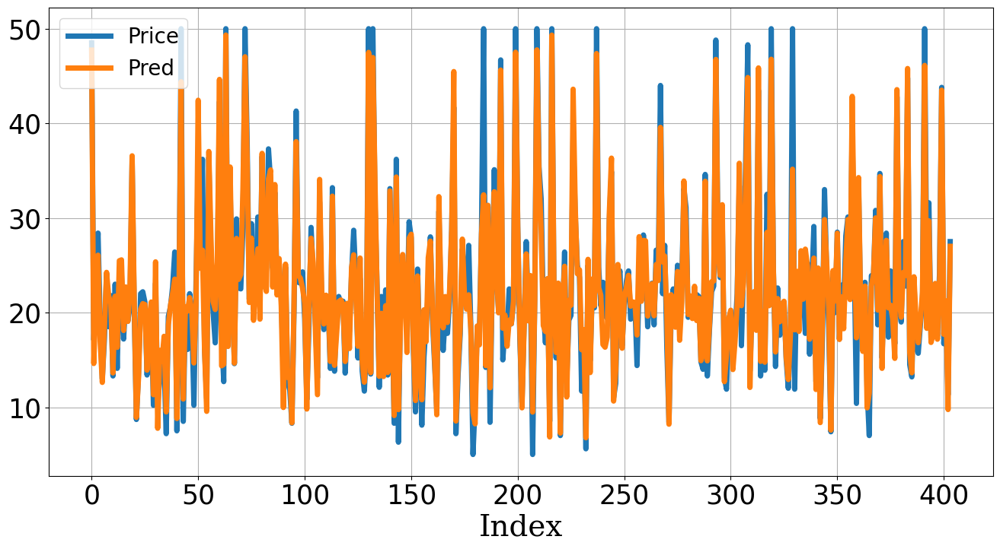

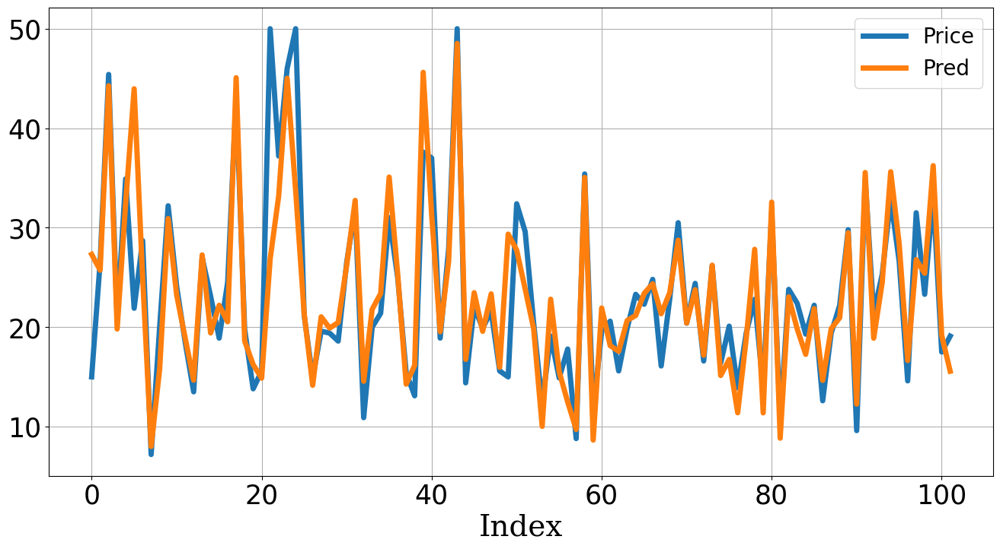

,MAE,MSE,MAPE
Train,1.62,5.51,0.08
Test,2.71,22.01,0.13


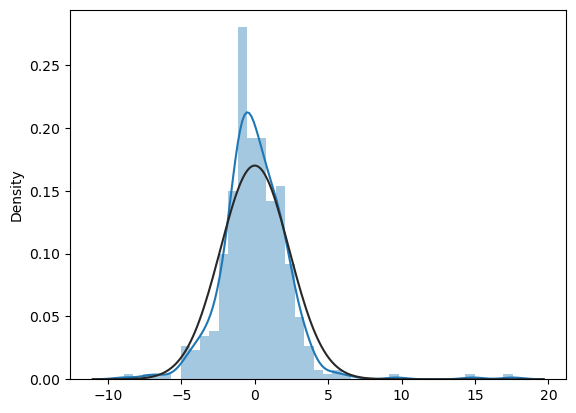

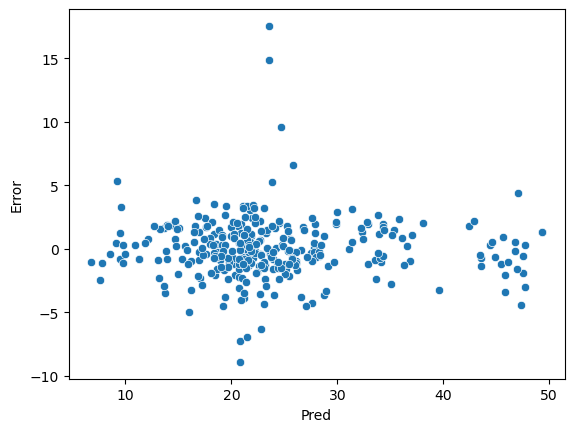

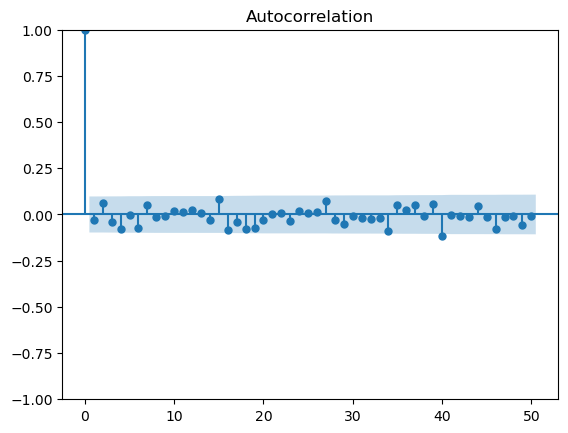

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.89,0.95,8.65,46.23
p-value,0.00,0.72,0.57,0.63
Alternative,NaN,two-sided,NaN,NaN


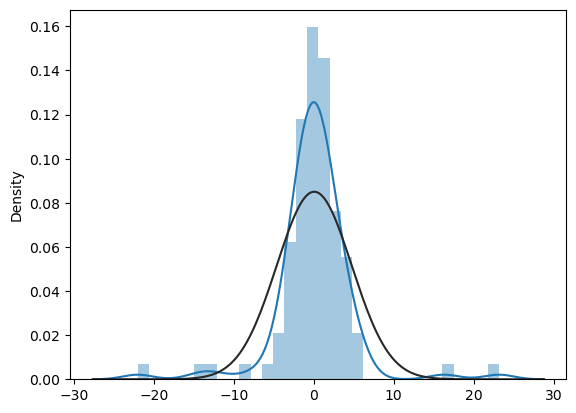

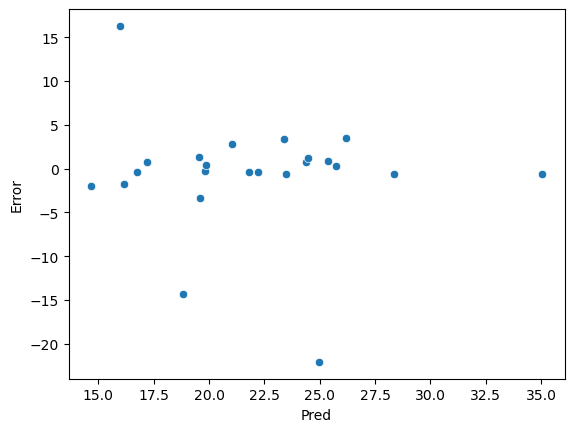

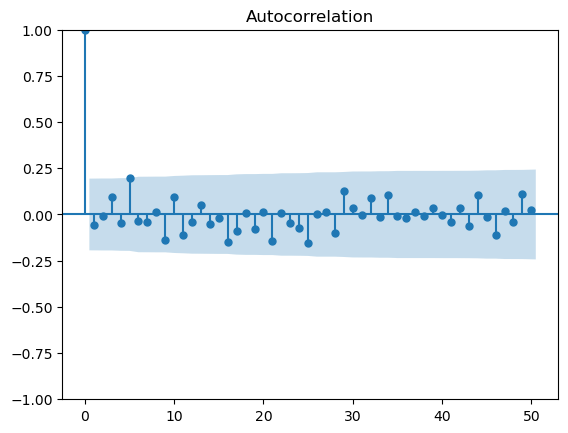

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.78,0.09,9.47,38.89
p-value,0.00,0.00,0.49,0.87
Alternative,NaN,two-sided,NaN,NaN


In [16]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# LightGBM
model_lgbm = LGBMRegressor(n_estimators=100,
                           learning_rate=0.1,
                           max_depth=3, random_state=123)
model_lgbm.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_lgbm.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_lgbm.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_lgbm = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_lgbm)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## LightGBM with Hyperparameter Tuning

(404, 13) (404, 1)
(102, 13) (102, 1)
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 985
[LightGBM] [Info] Number of data points in the train set: 404, number of used features: 17
[LightGBM] [Info] Start training from score 22.374753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

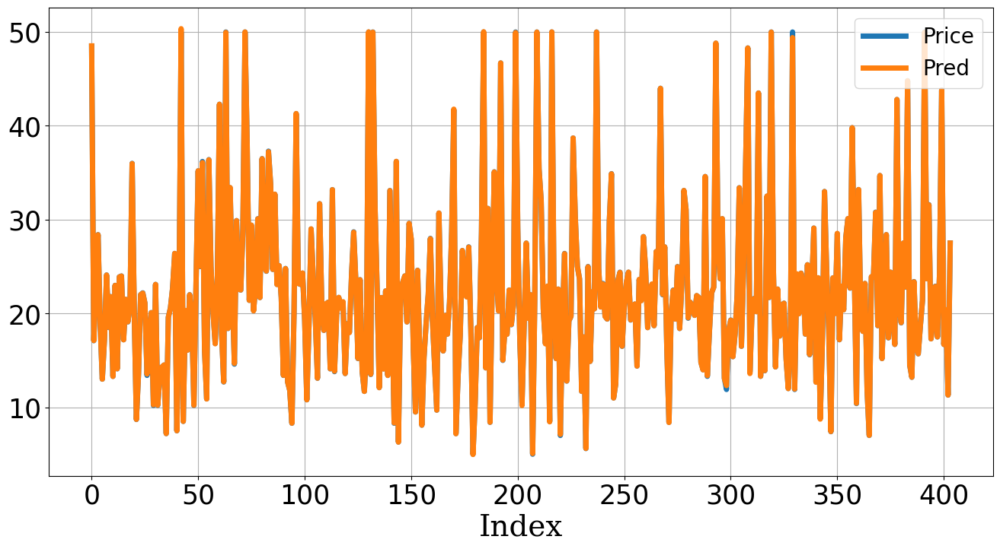

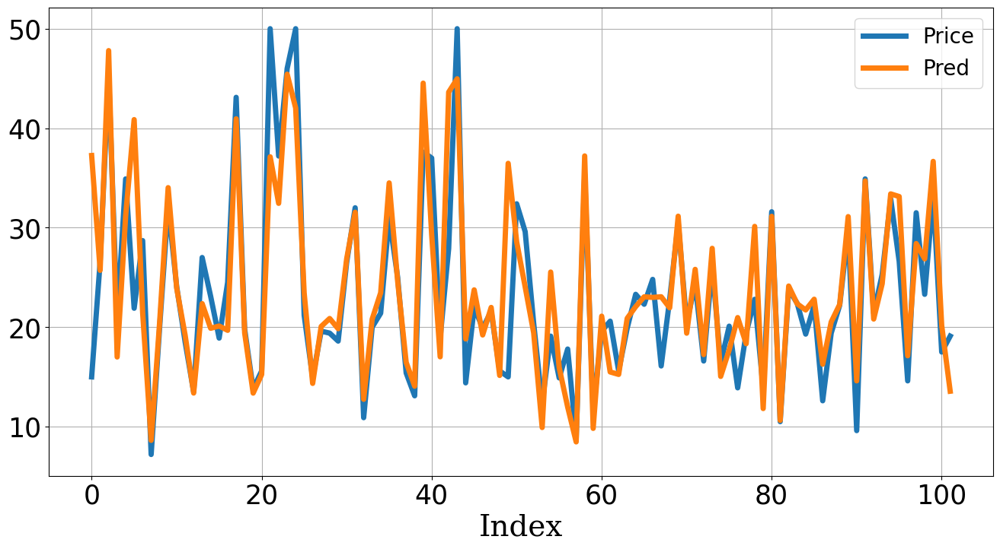

,MAE,MSE,MAPE
Train,0.02,0.00,0.00
Test,3.06,26.22,0.15


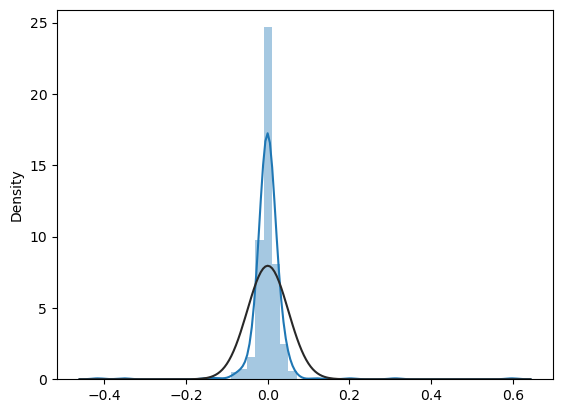

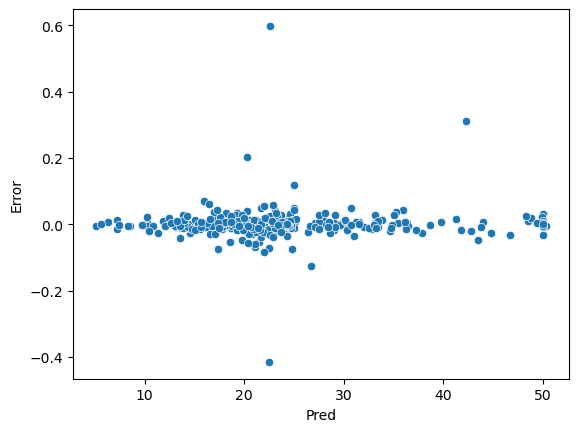

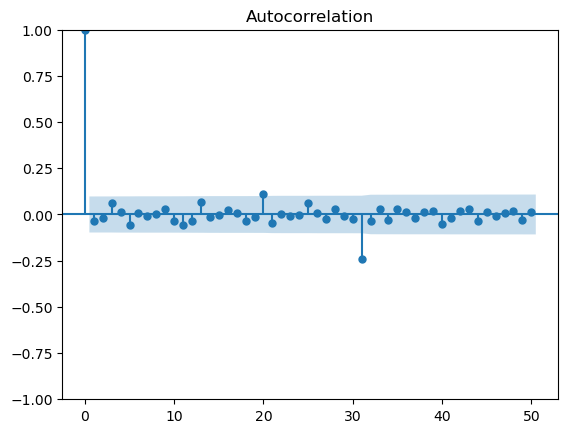

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.47,3.43,4.41,49.16
p-value,0.00,0.00,0.93,0.51
Alternative,NaN,two-sided,NaN,NaN


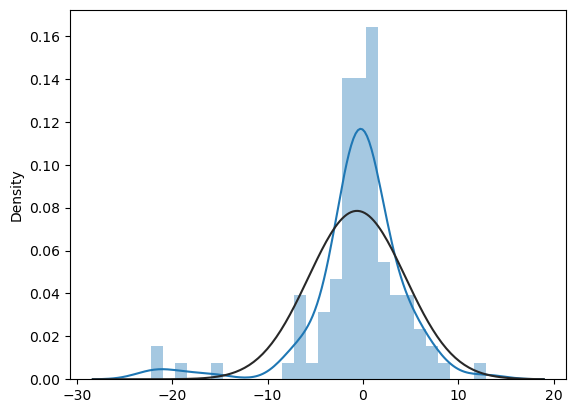

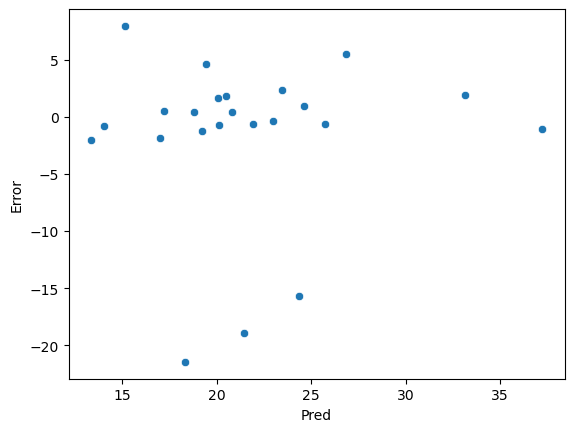

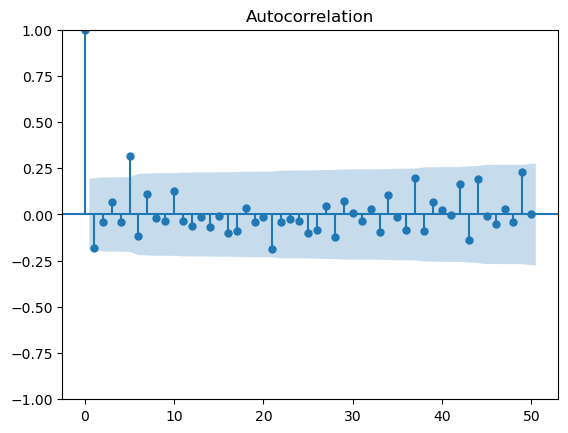

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.82,0.24,19.90,73.90
p-value,0.00,0.00,0.03,0.02
Alternative,NaN,two-sided,NaN,NaN


In [17]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# LightGBM
model_lgbm = LGBMRegressor()
params = {'n_estimators': [100],    
          'max_depth': [5, 7, 9, 11],   
          'min_child_weight': [5, 7, 9, 11]}    
model_lgbm_cv = GridSearchCV(estimator=model_lgbm, param_grid=params, 
                             cv=5,    
                             n_jobs=-1)   
model_lgbm_cv.fit(X_train_fes, Y_train)
print("최적 하이퍼 파라미터: ", model_lgbm_cv.best_params_)

model_lgbm_cv_final = XGBRegressor(**model_lgbm_cv.best_params_)
model_lgbm_cv_final.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_lgbm_cv_final.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_lgbm_cv_final.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_lgbm_cv_final = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_lgbm_cv_final)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## CatBoost

(404, 13) (404, 1)
(102, 13) (102, 1)


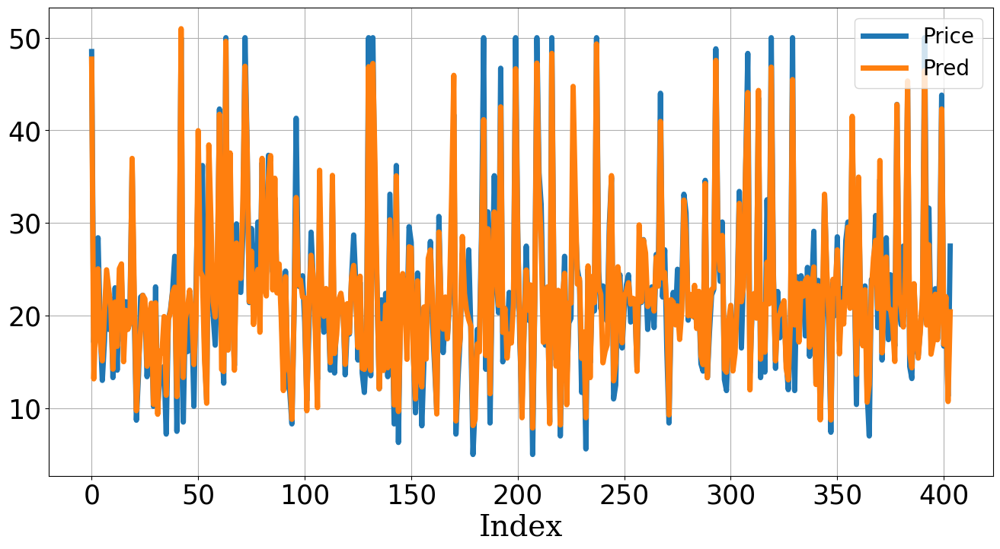

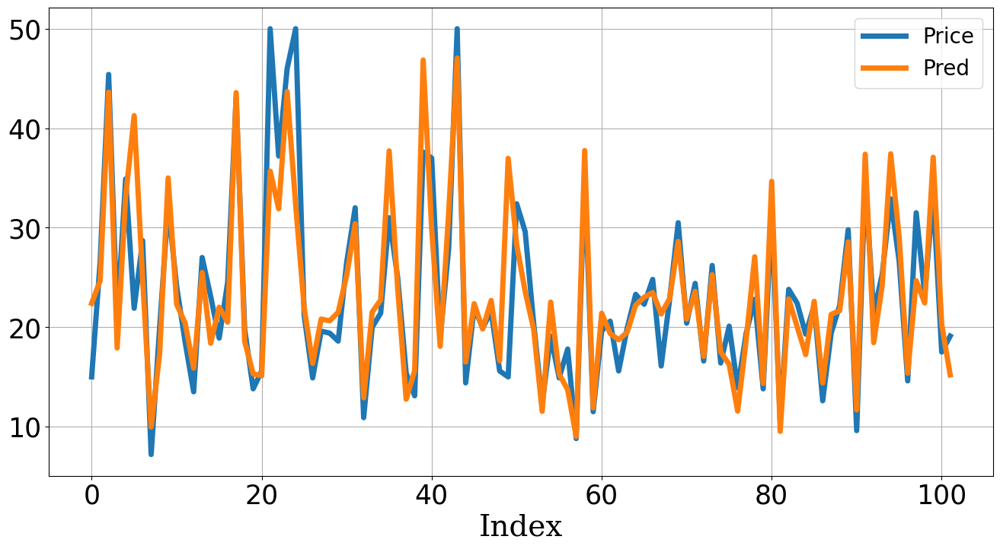

,MAE,MSE,MAPE
Train,1.88,6.21,0.10
Test,2.87,21.38,0.13


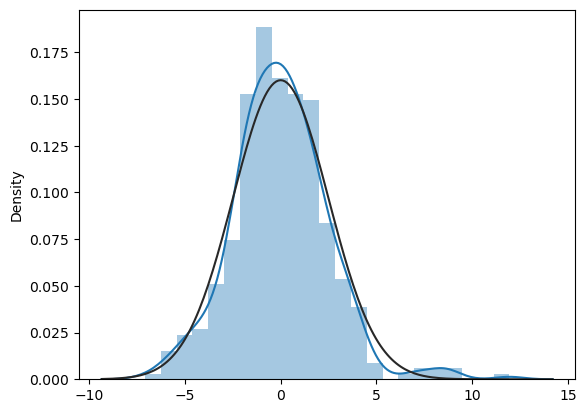

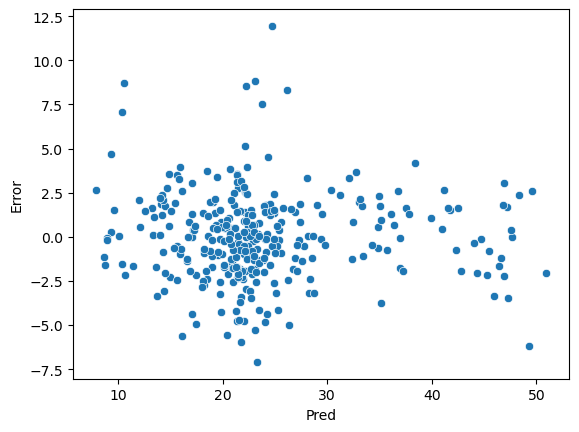

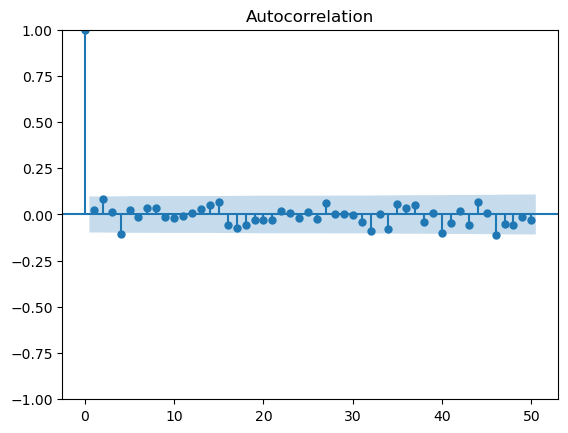

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.97,0.77,9.43,50.67
p-value,0.00,0.08,0.49,0.45
Alternative,NaN,two-sided,NaN,NaN


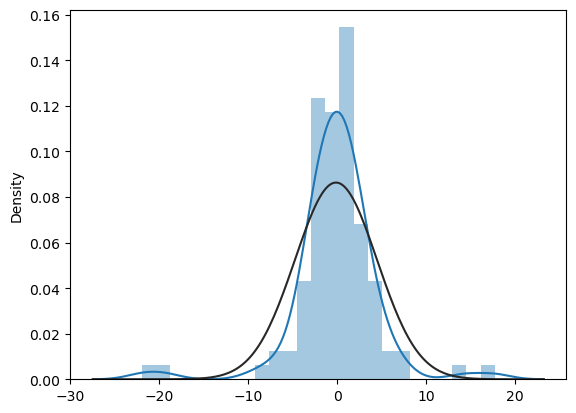

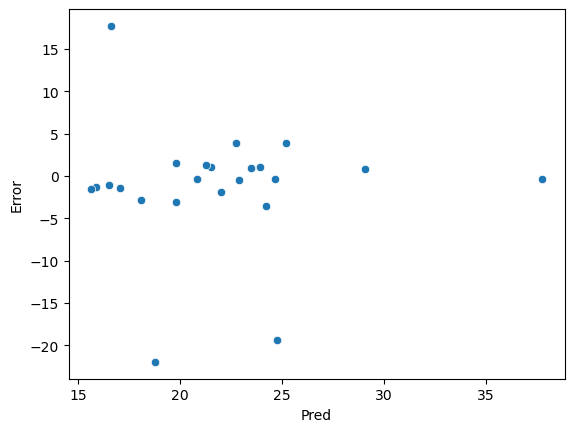

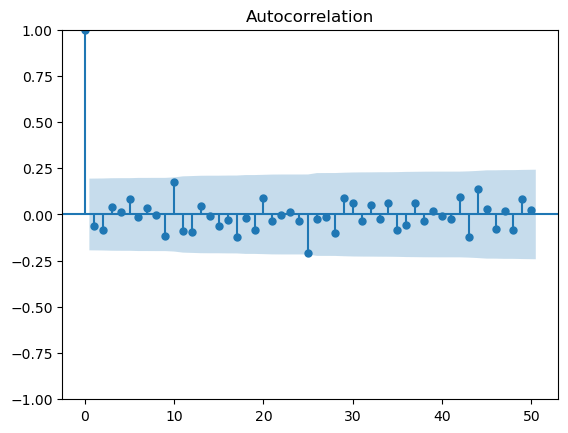

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.82,0.13,7.42,39.84
p-value,0.00,0.00,0.69,0.85
Alternative,NaN,two-sided,NaN,NaN


In [18]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# CatBoost
model_cb = CatBoostRegressor(n_estimators=100,
                             learning_rate=0.1,
                             max_depth=3, random_state=123,
                             verbose=0)
model_cb.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_cb.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_cb.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_cb = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_cb)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## CatBoost with Hyperparameter Tuning

(404, 13) (404, 1)
(102, 13) (102, 1)
최적 하이퍼 파라미터:  {'max_depth': 5, 'n_estimators': 100}
Learning rate set to 0.230668
0:	learn: 7.8562507	total: 1.37ms	remaining: 136ms
1:	learn: 7.0038589	total: 2.44ms	remaining: 120ms
2:	learn: 6.1635415	total: 3.51ms	remaining: 113ms
3:	learn: 5.5288144	total: 4.45ms	remaining: 107ms
4:	learn: 5.0210355	total: 5.43ms	remaining: 103ms
5:	learn: 4.6307365	total: 6.3ms	remaining: 98.7ms
6:	learn: 4.3842488	total: 7.18ms	remaining: 95.4ms
7:	learn: 4.1100720	total: 8.04ms	remaining: 92.4ms
8:	learn: 3.8381274	total: 9.53ms	remaining: 96.3ms
9:	learn: 3.6692524	total: 10.4ms	remaining: 94ms
10:	learn: 3.5500615	total: 11.5ms	remaining: 93.3ms
11:	learn: 3.4101322	total: 12.5ms	remaining: 91.4ms
12:	learn: 3.2574664	total: 13.4ms	remaining: 89.5ms
13:	learn: 3.1446609	total: 14.2ms	remaining: 87.3ms
14:	learn: 3.0213880	total: 15.2ms	remaining: 86.1ms
15:	learn: 2.9541460	total: 16.2ms	remaining: 84.9ms
16:	learn: 2.8857503	total: 17ms	remaining: 83.1ms

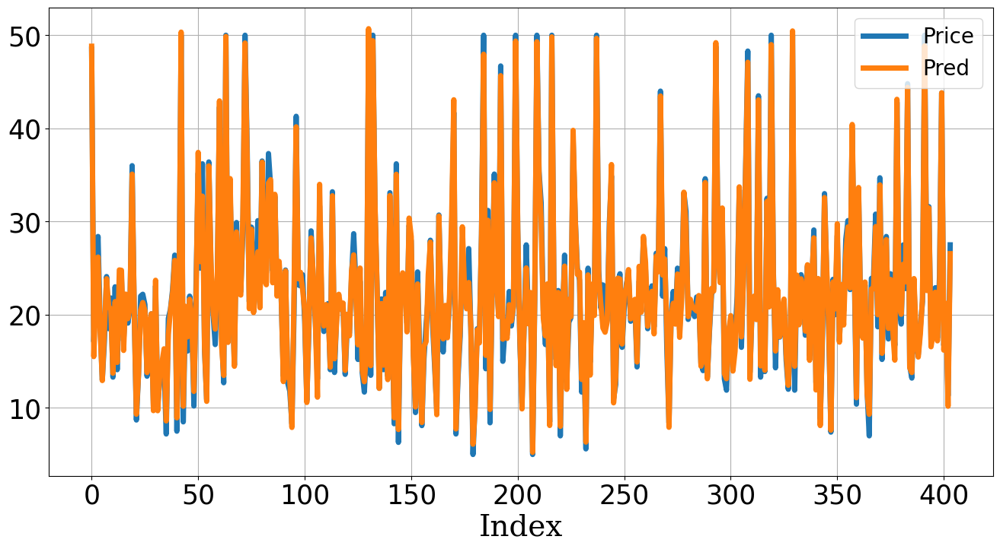

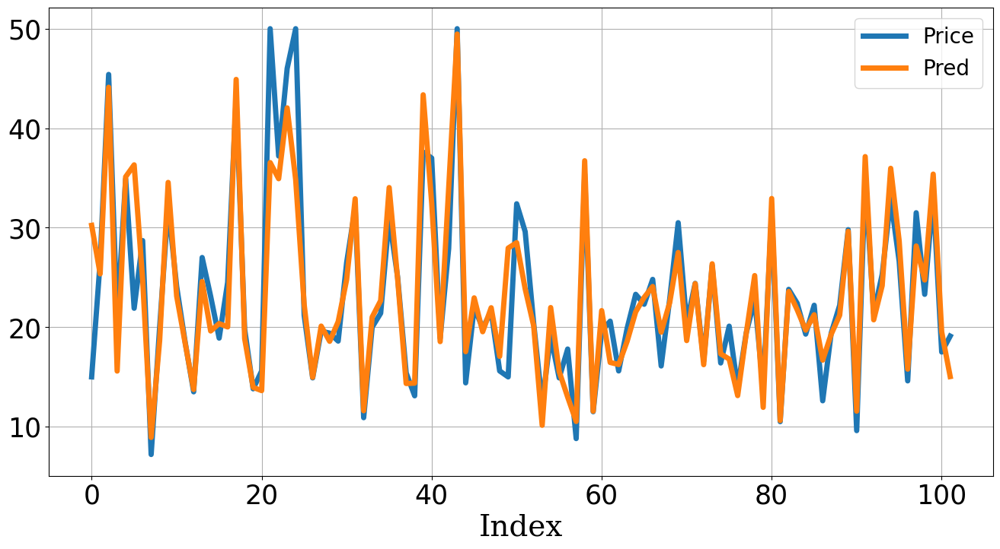

,MAE,MSE,MAPE
Train,0.82,1.09,0.04
Test,2.35,14.92,0.11


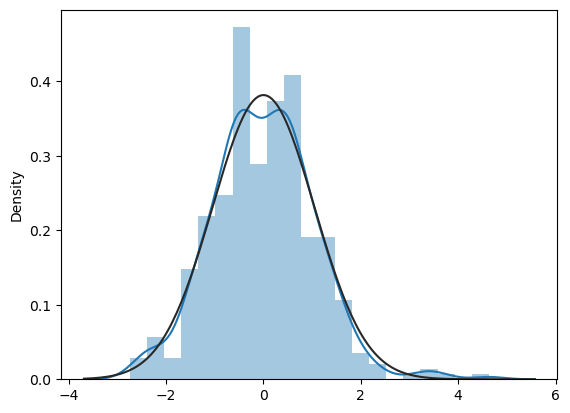

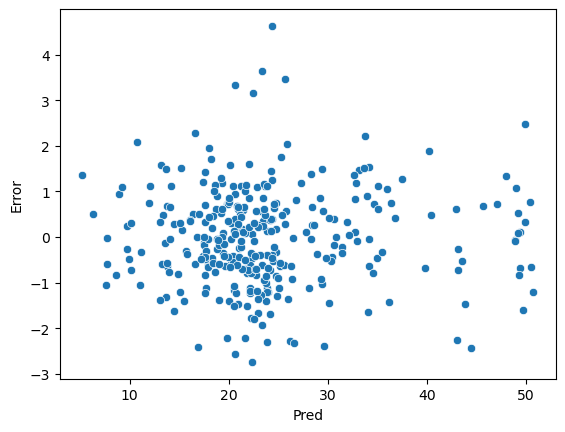

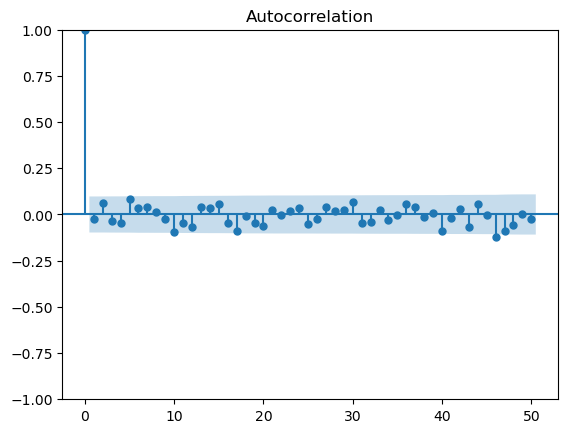

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.99,0.75,11.13,53.42
p-value,0.00,0.05,0.35,0.34
Alternative,NaN,two-sided,NaN,NaN


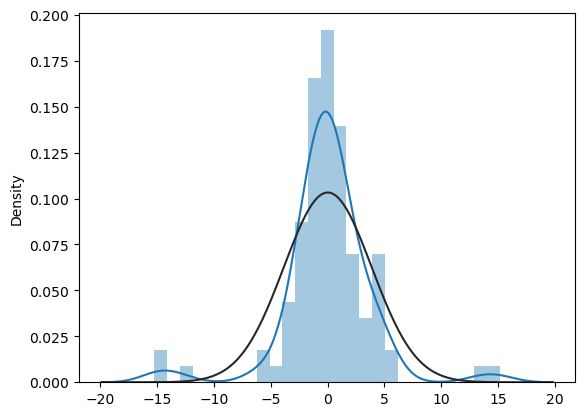

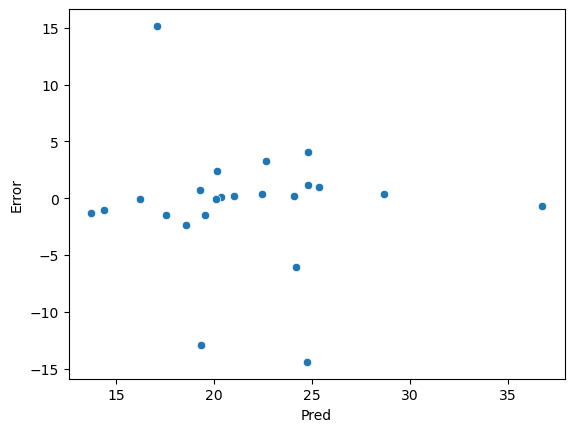

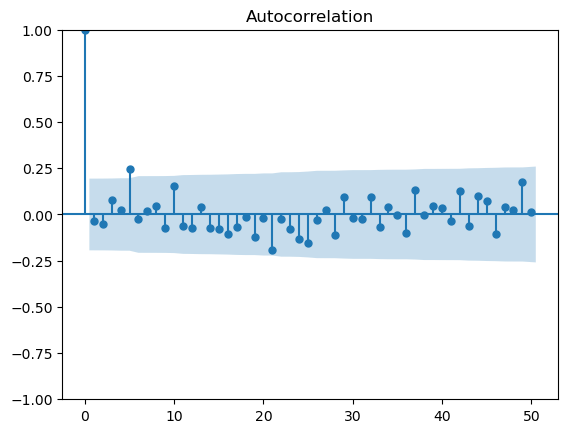

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.83,0.17,11.37,55.63
p-value,0.00,0.00,0.33,0.27
Alternative,NaN,two-sided,NaN,NaN


In [19]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# CatBoost
model_cb = CatBoostRegressor(verbose=0)
params = {'n_estimators': [100],    
          'max_depth': [5, 7, 9, 11]}    
model_cb_cv = GridSearchCV(estimator=model_cb, param_grid=params, 
                           cv=5,    
                           n_jobs=-1)   
model_cb_cv.fit(X_train_fes, Y_train)
print("최적 하이퍼 파라미터: ", model_cb_cv.best_params_)

model_cb_cv_final = CatBoostRegressor(**model_cb_cv.best_params_)
model_cb_cv_final.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_cb_cv_final.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_cb_cv_final.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_cb_cv_final = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_cb_cv_final)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

# **Advanced Algorithm:** Stacking

## Stacking

(404, 13) (404, 1)
(102, 13) (102, 1)


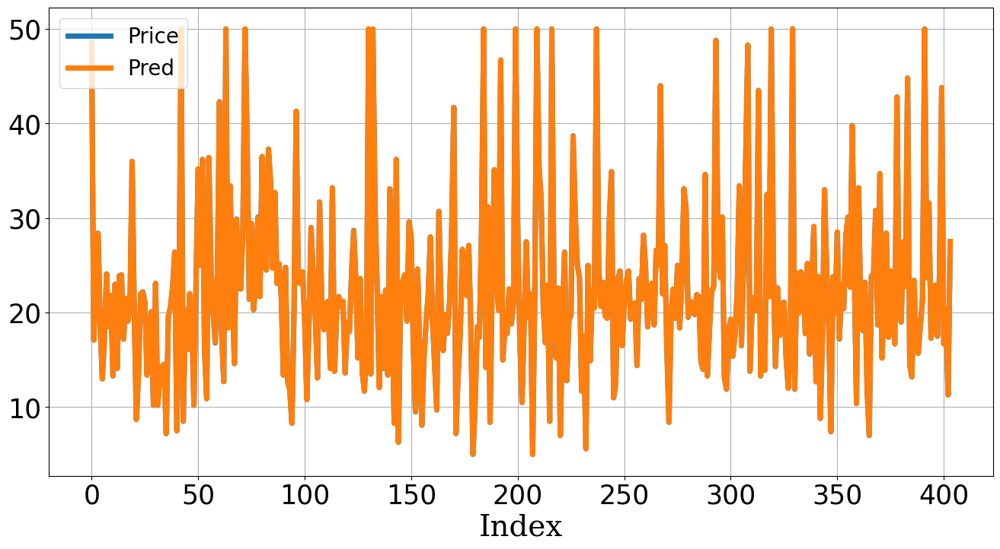

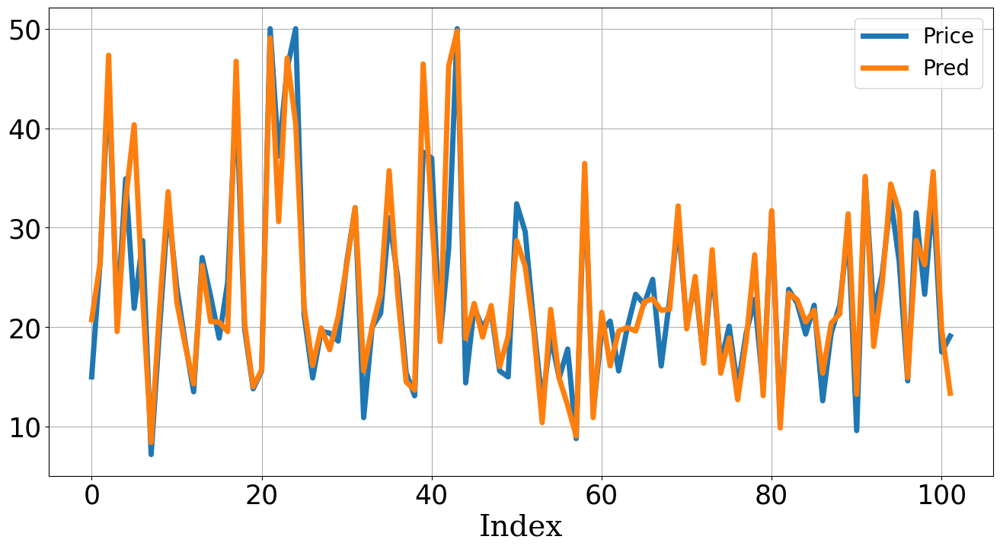

,MAE,MSE,MAPE
Train,0.01,0.00,0.00
Test,2.34,14.50,0.11


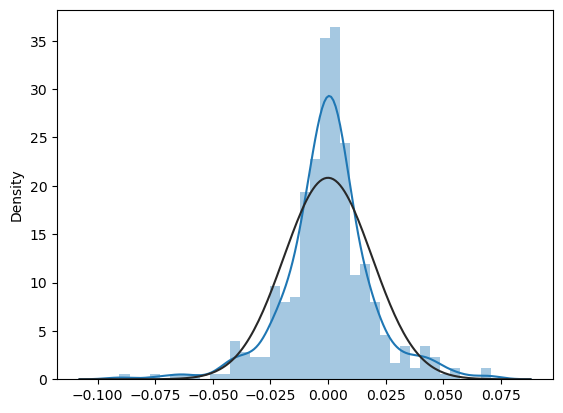

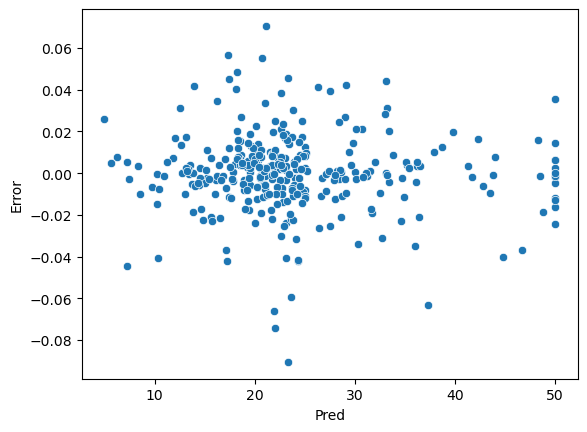

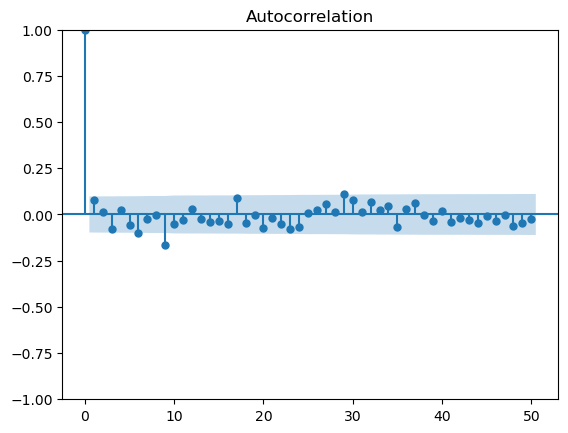

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.95,0.91,23.46,63.28
p-value,0.00,0.50,0.01,0.10
Alternative,NaN,two-sided,NaN,NaN


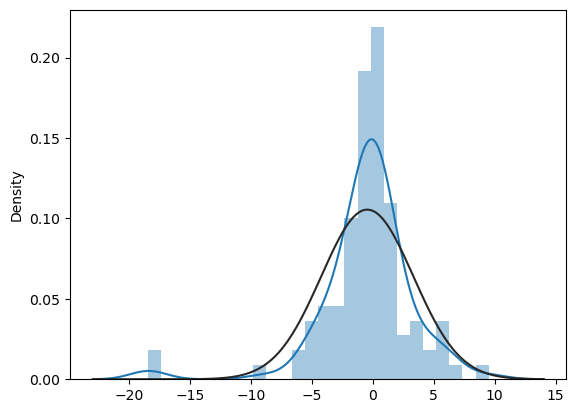

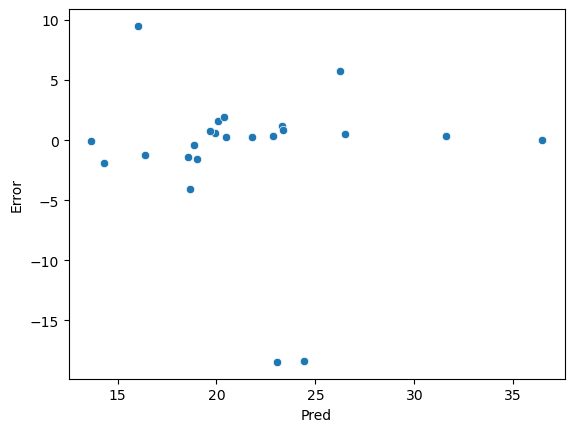

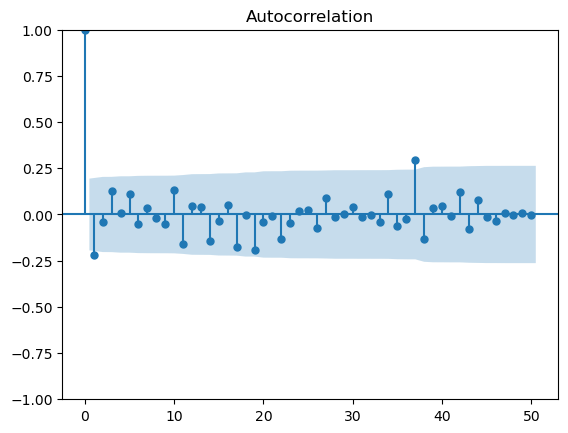

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.83,0.19,11.33,57.28
p-value,0.00,0.00,0.33,0.22
Alternative,NaN,two-sided,NaN,NaN


In [20]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Stacking
## Weak Learners
model_knn = KNeighborsRegressor()
model_svm = SVR()
model_rf = RandomForestRegressor()
model_xgb = XGBRegressor()

model_reg = LinearRegression()
res = [model_knn, model_svm, model_rf, model_xgb]
model_stack = StackingRegressor(regressors=res, 
                                meta_regressor=model_reg)
model_stack.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_stack.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_stack.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_stack = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_stack)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## Stacking with Hyperparameter Tuning

(404, 13) (404, 1)
(102, 13) (102, 1)


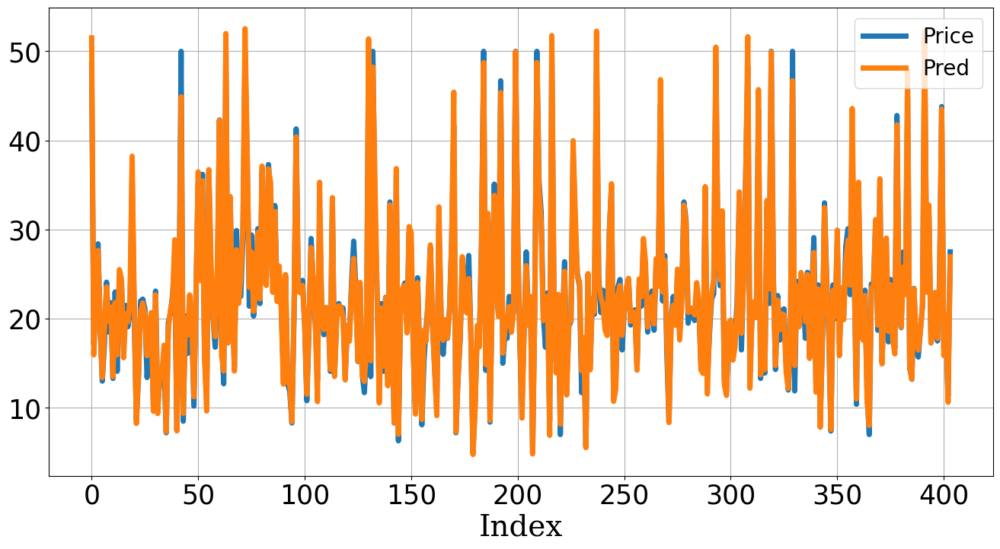

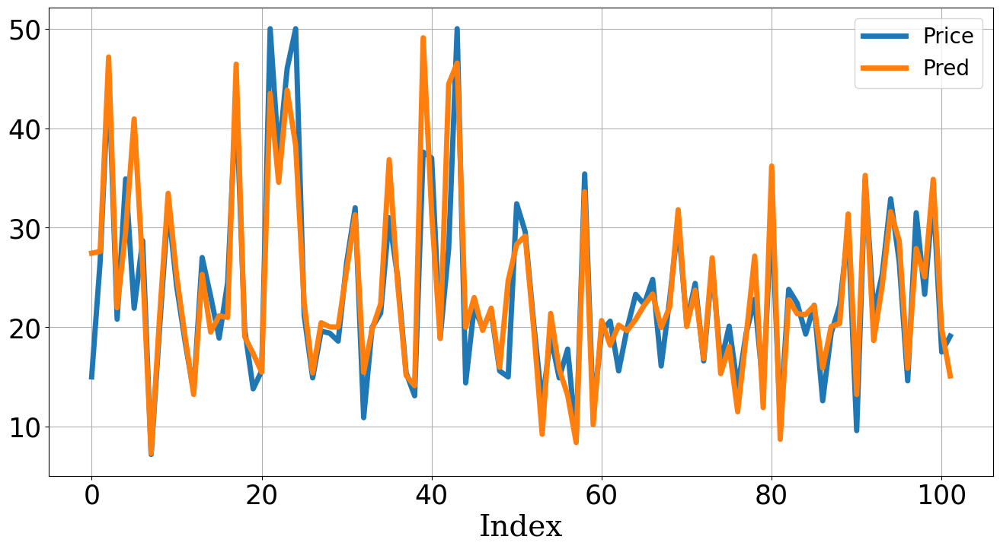

,MAE,MSE,MAPE
Train,0.86,1.34,0.04
Test,2.54,16.80,0.12


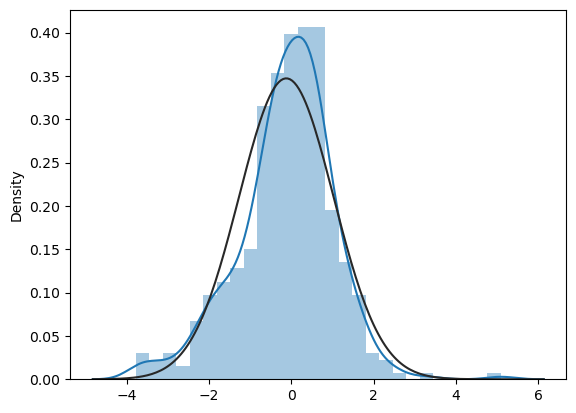

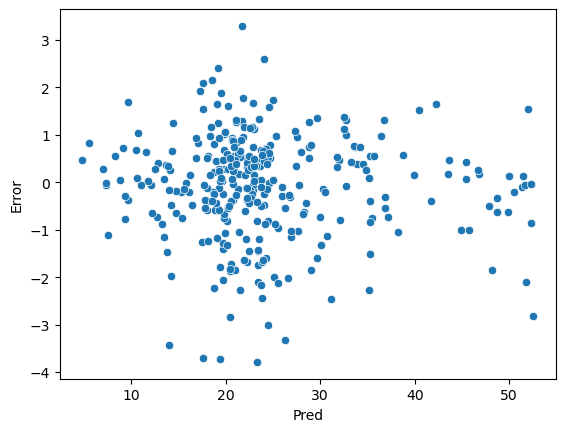

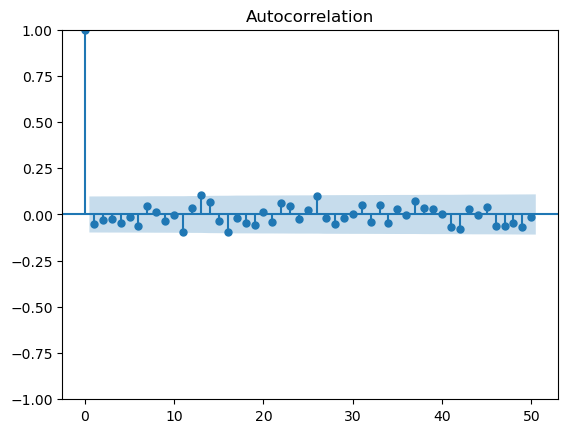

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.97,0.78,5.70,53.34
p-value,0.00,0.09,0.84,0.35
Alternative,NaN,two-sided,NaN,NaN


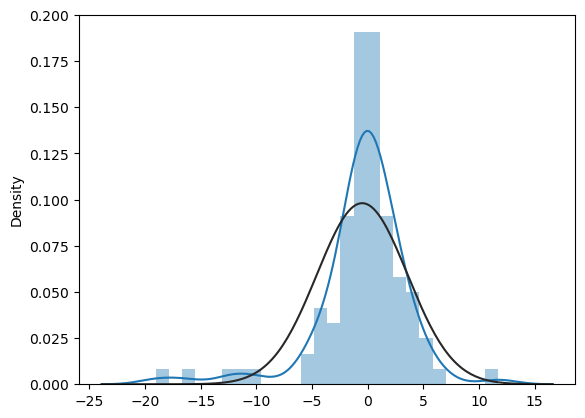

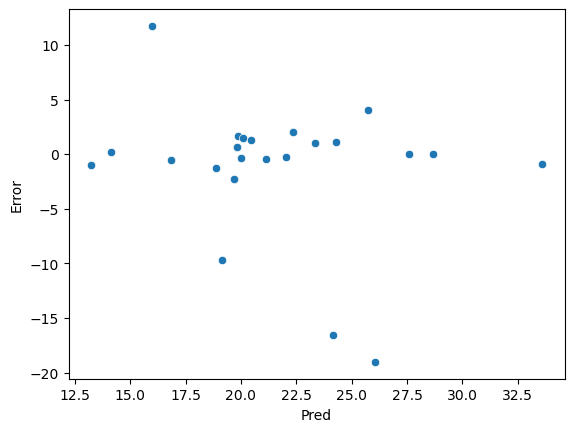

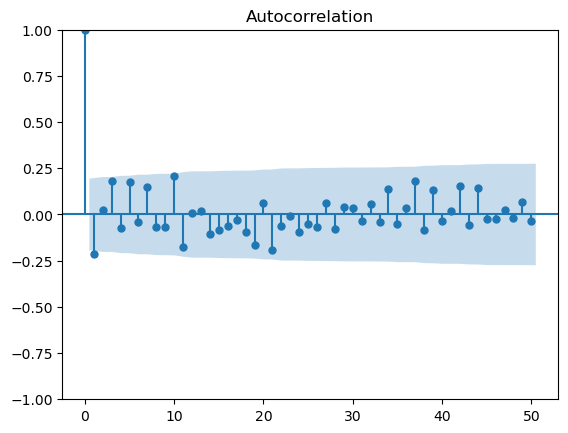

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.84,0.10,21.27,66.94
p-value,0.00,0.00,0.02,0.06
Alternative,NaN,two-sided,NaN,NaN


In [21]:
# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Stacking
## Weak Learners
model_knn = KNeighborsRegressor()
model_svm = SVR()
model_rf = RandomForestRegressor()
model_xgb = XGBRegressor()

model_reg = LinearRegression()
res = [model_knn, model_svm, model_rf, model_xgb]
model_stack = StackingCVRegressor(regressors=res, meta_regressor=model_reg)

params = {'kneighborsregressor__n_neighbors': [5, 7],
          'svr__kernel': ['rbf'],
          'randomforestregressor__n_estimators': [100],
          'randomforestregressor__max_depth': [5, 7, 9],    
          'xgbregressor__n_estimators': [100],    
          'xgbregressor__max_depth': [5, 7, 9]}
model_stack_cv = GridSearchCV(estimator=model_stack, param_grid=params, 
                              cv=5,    # CV 반복 횟수
                              n_jobs=-1)    # n_jobs=-1이면 모든 cpu사용 학습
model_stack_cv.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_stack_cv.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_stack_cv.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_stack_cv = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_stack_cv)

# 에러 분석
Resid_tr = Y_train - Y_trpred.values
Resid_tr.columns = ['Error']
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_tr = error_analysis(X_train_fes, Y_trpred, Resid_tr, graph_on=True)
display(Error_tr)
Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

# **Comparison**

,MAE,MSE,MAPE
Linear Regression,3.51,31.34,0.17
Ridge,3.51,31.30,0.17
Lasso,3.75,34.78,0.18
Elastic Net,3.56,32.00,0.17
Voting,2.86,25.04,0.12
Decision Tree,3.51,42.36,0.18
Random Forest,2.71,25.67,0.13
RF with CF,2.86,28.31,0.13
Gradient Boosting,2.61,20.01,0.13
GBM with CV,2.90,26.00,0.14


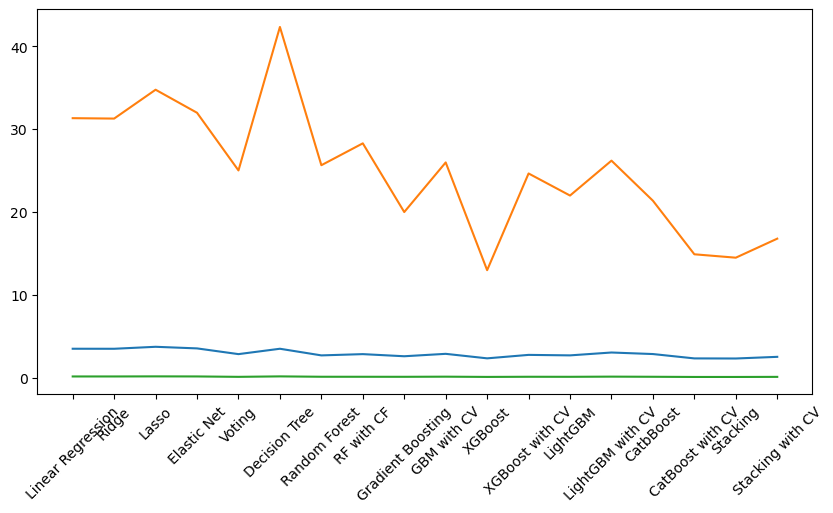

In [22]:
# 결과비교
labels = ['Linear Regression', 'Ridge', 'Lasso', 'Elastic Net', 
          'Voting', 'Decision Tree', 'Random Forest', 'RF with CF', 
          'Gradient Boosting', 'GBM with CV', 'XGBoost', 'XGBoost with CV', 
          'LightGBM', 'LightGBM with CV', 'CatbBoost', 'CatBoost with CV',
          'Stacking', 'Stacking with CV']
models = [Score_lr, Score_ridge, Score_lasso, Score_en, Score_voting, Score_dt,
          Score_rf, Score_rf_cv_final, Score_gb, Score_gb_cv_final,
          Score_xgb, Score_xgb_cv_final, Score_lgbm, Score_lgbm_cv_final, 
          Score_cb, Score_cb_cv_final, Score_stack, Score_stack_cv]
result_regression = pd.DataFrame()
for result in models:
    result_regression = pd.concat([result_regression, result.iloc[1:,:]], axis=0)
result_regression.index = labels
display(result_regression)

# 시각화
plt.figure(figsize=(10,5))
plt.plot(result_regression)
plt.xticks(rotation=45)
plt.show()